In [5]:
# ========================== KÜTÜPHANELER ==========================
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from google.colab import drive
from sklearn.metrics import f1_score, jaccard_score # IoU için jaccard_score kullanılır

# ========================== GOOGLE DRIVE BAĞLANTISI ==========================
drive.mount('/content/drive')
DATASET_PATH = "/content/drive/MyDrive/wood_dataset/wood"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Kullanılacak cihaz: {device}")

# Görüntü boyutu
IMG_SIZE = (256, 256)

# Eğitim parametreleri
BATCH_SIZE = 16 # Bellek durumuna göre ayarlanabilir
EPOCHS = 60 # Örnek bir değer, model ve veri setine göre ayarlanabilir
LEARNING_RATE = 1e-4

Mounted at /content/drive
Kullanılacak cihaz: cpu


In [6]:
# ========================== WoodDataset TANIMI ==========================

class WoodDataset(Dataset):
    def __init__(self, image_paths, transform=None, is_test_defect=False, ground_truth_dir=None):
        """
        Args:
            image_paths (list): Görüntü dosyalarının yollarını içeren liste.
            transform (callable, optional): Görüntülere uygulanacak dönüşümler.
            is_test_defect (bool): Bu veri setinin kusurlu test görüntülerini içerip içermediği.
            ground_truth_dir (str, optional): Kusurlu test görüntüleri için maske dosyalarının bulunduğu dizin.
        """
        self.image_paths = image_paths
        self.transform = transform
        self.is_test_defect = is_test_defect
        self.ground_truth_dir = ground_truth_dir

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        # Görüntüyü PIL Image olarak aç ve RGB'ye dönüştür (eğer değilse)
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image_tensor = self.transform(image)
        else:
            # Varsayılan dönüşümler (eğer transform sağlanmazsa)
            preprocess = transforms.Compose([
                transforms.Resize(IMG_SIZE),
                transforms.ToTensor(), # Otomatik olarak [0,1] aralığına normalize eder ve (C, H, W) formatına getirir
                # transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]) # İsteğe bağlı: [-1, 1] aralığına normalizasyon
            ])
            image_tensor = preprocess(image)

        if self.is_test_defect and self.ground_truth_dir:
            base_filename = os.path.basename(img_path)
            base_name = os.path.splitext(base_filename)[0]

            possible_mask_paths = [
                os.path.join(self.ground_truth_dir, base_name + ".png"),
                os.path.join(self.ground_truth_dir, base_name + ".jpg"),
                os.path.join(self.ground_truth_dir, base_name + "_mask.png"),
                os.path.join(self.ground_truth_dir, base_name + "_mask.jpg")
            ]

            mask_path = None
            for possible_path in possible_mask_paths:
                if os.path.exists(possible_path):
                    mask_path = possible_path
                    break

            if mask_path:
                mask = Image.open(mask_path).convert("L") # Gri tonlamalı olarak aç (tek kanal)
                mask_transform = transforms.Compose([
                    transforms.Resize(IMG_SIZE, interpolation=transforms.InterpolationMode.NEAREST),
                    transforms.ToTensor()
                ])
                mask_tensor = mask_transform(mask)
                mask_tensor = (mask_tensor > 0.5).float()
            else:
                # print(f"Uyarı: Maske dosyası bulunamadı: {mask_path_png} veya {mask_path_jpg}")
                mask_tensor = torch.zeros(1, IMG_SIZE[0], IMG_SIZE[1])
            return image_tensor, mask_tensor, img_path
        else:
            return image_tensor, torch.empty(0), img_path

# Örnek dönüşümler
transform = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # ImageNet istatistikleri
])

Eğitim için normal görüntü sayısı: 70
Test için normal görüntü sayısı: 70
Test için kusurlu görüntü sayısı: 71

Örnek eğitim verisi:
Batch shape: torch.Size([16, 3, 256, 256])


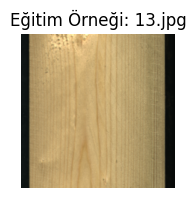


Örnek kusurlu test verisi ve maskesi:
Batch image shape: torch.Size([16, 3, 256, 256]), mask shape: torch.Size([16, 1, 256, 256])


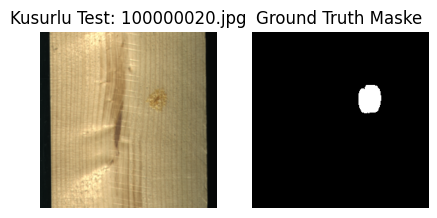


Örnek normal test verisi:
Batch shape: torch.Size([16, 3, 256, 256])


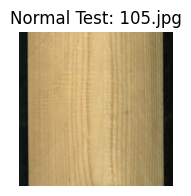

In [7]:
# ========================== VERİ YÜKLEYİCİLERİ ==========================

# Veri Yükleyicilerin Oluşturulması
def get_image_paths(directory, extensions=('.jpg', '.jpeg', '.png')):
    """Belirtilen dizindeki tüm resim dosyalarının yollarını alır."""
    paths = []
    if not os.path.isdir(directory):
        print(f"Uyarı: Dizin bulunamadı veya geçerli değil: {directory}")
        return paths
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(extensions):
                paths.append(os.path.join(root, file))
    return paths

# Veri seti yolları
train_good_dir = os.path.join(DATASET_PATH, "train", "good")
test_good_dir = os.path.join(DATASET_PATH, "test", "good")
test_defect_dir = os.path.join(DATASET_PATH, "test", "defect")
ground_truth_defect_dir = os.path.join(DATASET_PATH, "ground_truth", "defect")

# Dosya yollarını al
train_good_paths = get_image_paths(train_good_dir)
test_good_paths = get_image_paths(test_good_dir)
test_defect_paths = get_image_paths(test_defect_dir)

print(f"Eğitim için normal görüntü sayısı: {len(train_good_paths)}")
print(f"Test için normal görüntü sayısı: {len(test_good_paths)}")
print(f"Test için kusurlu görüntü sayısı: {len(test_defect_paths)}")

# Veri setlerini oluştur
train_dataset = WoodDataset(image_paths=train_good_paths, transform=transform)
test_good_dataset = WoodDataset(image_paths=test_good_paths, transform=transform)
test_defect_dataset = WoodDataset(image_paths=test_defect_paths, transform=transform,
                                  is_test_defect=True, ground_truth_dir=ground_truth_defect_dir)

# Veri yükleyicilerini oluştur
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=True) # num_workers=0 Windows'ta bazen daha stabil
test_good_loader = DataLoader(test_good_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
test_defect_loader = DataLoader(test_defect_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

# Birkaç örnek görüntü ve maskeyi kontrol edelim (veri varsa)
def show_sample_data():
    print("\nÖrnek eğitim verisi:")
    if len(train_dataset) > 0:
        images, _, paths = next(iter(train_loader))
        print(f"Batch shape: {images.shape}")
        plt.figure(figsize=(2,2))
        plt.imshow(images[0].permute(1, 2, 0).cpu().numpy())
        plt.title(f"Eğitim Örneği: {os.path.basename(paths[0])}")
        plt.axis('off')
        plt.show()
    else:
        print("Eğitim verisi bulunamadı.")

    if len(test_defect_dataset) > 0:
        print("\nÖrnek kusurlu test verisi ve maskesi:")
        images, masks, paths = next(iter(test_defect_loader))
        if images.nelement() > 0 and masks.nelement() > 0:
            print(f"Batch image shape: {images.shape}, mask shape: {masks.shape}")
            fig, axes = plt.subplots(1, 2, figsize=(5, 2.5))
            axes[0].imshow(images[0].permute(1, 2, 0).cpu().numpy())
            axes[0].set_title(f"Kusurlu Test: {os.path.basename(paths[0])}")
            axes[0].axis('off')
            axes[1].imshow(masks[0].squeeze().cpu().numpy(), cmap='gray')
            axes[1].set_title("Ground Truth Maske")
            axes[1].axis('off')
            plt.show()
        else:
            print("Kusurlu test verisi veya maskesi yüklenirken sorun oluştu.")
    else:
        print("Kusurlu test verisi bulunamadı.")

    if len(test_good_dataset) > 0:
        print("\nÖrnek normal test verisi:")
        images, _, paths = next(iter(test_good_loader))
        print(f"Batch shape: {images.shape}")
        plt.figure(figsize=(2,2))
        plt.imshow(images[0].permute(1, 2, 0).cpu().numpy())
        plt.title(f"Normal Test: {os.path.basename(paths[0])}")
        plt.axis('off')
        plt.show()
    else:
        print("Normal test verisi bulunamadı.")

if len(train_good_paths) > 0 or len(test_good_paths) > 0 or len(test_defect_paths) > 0:
    show_sample_data()
else:
    print("Gösterilecek veri bulunamadı. Lütfen DATASET_PATH'i kontrol edin.")

In [8]:
# ========================== MODELLER ==========================

# 1. Autoencoder Modeli (Basitleştirilmiş)
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        # Encoder
        self.enc1 = nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1)  # 256x256x3 -> 128x128x32
        self.enc2 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1) # 128x128x32 -> 64x64x64
        self.enc3 = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)# 64x64x64 -> 32x32x128 (latent)

        # Decoder
        self.dec3 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1) # 32x32x128 -> 64x64x64
        self.dec2 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1) # 64x64x64 -> 128x128x32
        self.dec1 = nn.ConvTranspose2d(32, 3, kernel_size=3, stride=2, padding=1, output_padding=1)  # 128x128x32 -> 256x256x3

    def forward(self, x):
        x = F.relu(self.enc1(x))
        x = F.relu(self.enc2(x))
        x = F.relu(self.enc3(x)) # Latent space
        x = F.relu(self.dec3(x))
        x = F.relu(self.dec2(x))
        reconstructed = torch.sigmoid(self.dec1(x)) # [0,1] aralığı için sigmoid
        return reconstructed

# 2. Hafif Evrişimli Autoencoder (Lightweight Convolutional Autoencoder)
class LCAE(nn.Module):
    def __init__(self):
        super(LCAE, self).__init__()
        # Encoder - daha az filtre ve daha sığ yapı
        self.enc1 = nn.Conv2d(3, 16, kernel_size=5, stride=2, padding=2)  # 256x256x3 -> 128x128x16
        self.enc2 = nn.Conv2d(16, 32, kernel_size=5, stride=2, padding=2) # 128x128x16 -> 64x64x32

        # Decoder
        self.dec2 = nn.ConvTranspose2d(32, 16, kernel_size=5, stride=2, padding=2, output_padding=1) # 64x64x32 -> 128x128x16
        self.dec1 = nn.ConvTranspose2d(16, 3, kernel_size=5, stride=2, padding=2, output_padding=1)  # 128x128x16 -> 256x256x3

    def forward(self, x):
        # Encoder
        x = F.leaky_relu(self.enc1(x), 0.2)
        latent = F.leaky_relu(self.enc2(x), 0.2)
        # Decoder
        x = F.leaky_relu(self.dec2(latent), 0.2)
        reconstructed = torch.sigmoid(self.dec1(x))
        return reconstructed

# 3. PatchCore benzeri hafıza bankası yaklaşımı
class MemoryBankModel(nn.Module):
    def __init__(self, feature_dim=32):
        super(MemoryBankModel, self).__init__()
        # Basit bir özellik çıkarıcı
        self.feature_extractor = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(16, feature_dim, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        # Hafıza bankası yerine otokodlayıcı
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(feature_dim, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        features = self.feature_extractor(x)
        reconstructed = self.decoder(features)
        return reconstructed

# Modelleri test edelim (dummy input ile)
dummy_input = torch.randn(2, 3, IMG_SIZE[0], IMG_SIZE[1]).to(device)

print("\nModel Testleri:")
try:
    ae_model = Autoencoder().to(device)
    ae_output = ae_model(dummy_input)
    print(f"Autoencoder input shape: {dummy_input.shape}, output shape: {ae_output.shape}")
    assert ae_output.shape == dummy_input.shape, "Autoencoder output shape mismatch!"
except Exception as e:
    print(f"Autoencoder hata: {e}")

try:
    lcae_model = LCAE().to(device)
    lcae_output = lcae_model(dummy_input)
    print(f"LCAE input shape: {dummy_input.shape}, output shape: {lcae_output.shape}")
    assert lcae_output.shape == dummy_input.shape, "LCAE output shape mismatch!"
except Exception as e:
    print(f"LCAE hata: {e}")

try:
    mb_model = MemoryBankModel().to(device)
    mb_output = mb_model(dummy_input)
    print(f"MemoryBank input shape: {dummy_input.shape}, output shape: {mb_output.shape}")
    assert mb_output.shape == dummy_input.shape, "MemoryBank output shape mismatch!"
except Exception as e:
    print(f"MemoryBank hata: {e}")


Model Testleri:
Autoencoder input shape: torch.Size([2, 3, 256, 256]), output shape: torch.Size([2, 3, 256, 256])
LCAE input shape: torch.Size([2, 3, 256, 256]), output shape: torch.Size([2, 3, 256, 256])
MemoryBank input shape: torch.Size([2, 3, 256, 256]), output shape: torch.Size([2, 3, 256, 256])


In [9]:
# ========================== MODEL VE OPTİMİZER TANIMLARI ==========================
# Modellerin, Kayıp Fonksiyonlarının ve Optimizatörlerin Başlatılması

models_dict = {
    "Autoencoder": Autoencoder().to(device),
    "LCAE": LCAE().to(device),
    "MemoryBankModel": MemoryBankModel().to(device)
}

criterions = {name: nn.MSELoss().to(device) for name in models_dict.keys()}
optimizers = {
    name: optim.Adam(model.parameters(), lr=LEARNING_RATE)
    for name, model in models_dict.items()
}

print("Modeller, kayıp fonksiyonları ve optimizatörler hazır.")

Modeller, kayıp fonksiyonları ve optimizatörler hazır.


--- Autoencoder Modeli Eğitimi Başlıyor ---
Epoch [1/60], Batch [1/5], Anlık Kayıp: 0.0630
Epoch [1/60], Batch [2/5], Anlık Kayıp: 0.0658
Epoch [1/60], Batch [3/5], Anlık Kayıp: 0.0597
Epoch [1/60], Batch [4/5], Anlık Kayıp: 0.0681
Epoch [1/60], Batch [5/5], Anlık Kayıp: 0.0657
Epoch [1/60] tamamlandı. Ortalama Eğitim Kaybı: 0.064276
Epoch [2/60], Batch [1/5], Anlık Kayıp: 0.0628
Epoch [2/60], Batch [2/5], Anlık Kayıp: 0.0630
Epoch [2/60], Batch [3/5], Anlık Kayıp: 0.0639
Epoch [2/60], Batch [4/5], Anlık Kayıp: 0.0663
Epoch [2/60], Batch [5/5], Anlık Kayıp: 0.0646
Epoch [2/60] tamamlandı. Ortalama Eğitim Kaybı: 0.064051
Epoch [3/60], Batch [1/5], Anlık Kayıp: 0.0606
Epoch [3/60], Batch [2/5], Anlık Kayıp: 0.0639
Epoch [3/60], Batch [3/5], Anlık Kayıp: 0.0683
Epoch [3/60], Batch [4/5], Anlık Kayıp: 0.0624
Epoch [3/60], Batch [5/5], Anlık Kayıp: 0.0639
Epoch [3/60] tamamlandı. Ortalama Eğitim Kaybı: 0.063800
Epoch [4/60], Batch [1/5], Anlık Kayıp: 0.0653
Epoch [4/60], Batch [2/5], Anlık 

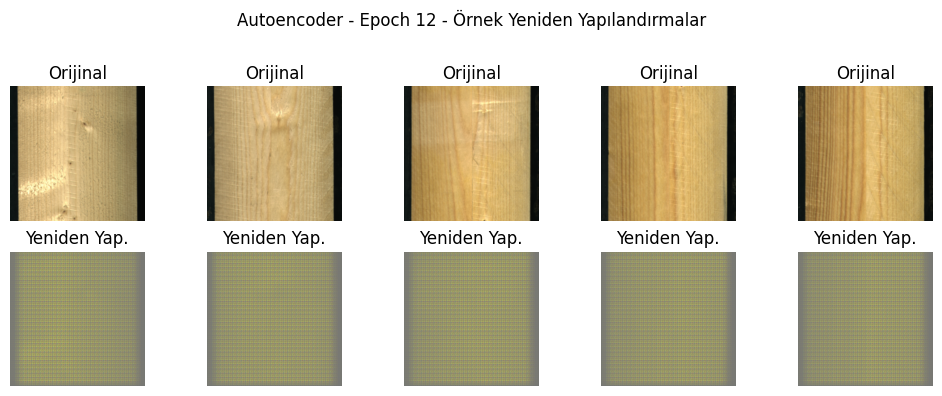

Epoch [13/60], Batch [1/5], Anlık Kayıp: 0.0473
Epoch [13/60], Batch [2/5], Anlık Kayıp: 0.0406
Epoch [13/60], Batch [3/5], Anlık Kayıp: 0.0414
Epoch [13/60], Batch [4/5], Anlık Kayıp: 0.0399
Epoch [13/60], Batch [5/5], Anlık Kayıp: 0.0366
Epoch [13/60] tamamlandı. Ortalama Eğitim Kaybı: 0.041806
Epoch [14/60], Batch [1/5], Anlık Kayıp: 0.0370
Epoch [14/60], Batch [2/5], Anlık Kayıp: 0.0384
Epoch [14/60], Batch [3/5], Anlık Kayıp: 0.0411
Epoch [14/60], Batch [4/5], Anlık Kayıp: 0.0382
Epoch [14/60], Batch [5/5], Anlık Kayıp: 0.0362
Epoch [14/60] tamamlandı. Ortalama Eğitim Kaybı: 0.038457
Epoch [15/60], Batch [1/5], Anlık Kayıp: 0.0360
Epoch [15/60], Batch [2/5], Anlık Kayıp: 0.0355
Epoch [15/60], Batch [3/5], Anlık Kayıp: 0.0354
Epoch [15/60], Batch [4/5], Anlık Kayıp: 0.0341
Epoch [15/60], Batch [5/5], Anlık Kayıp: 0.0418
Epoch [15/60] tamamlandı. Ortalama Eğitim Kaybı: 0.035803
Epoch [16/60], Batch [1/5], Anlık Kayıp: 0.0327
Epoch [16/60], Batch [2/5], Anlık Kayıp: 0.0324
Epoch [16/

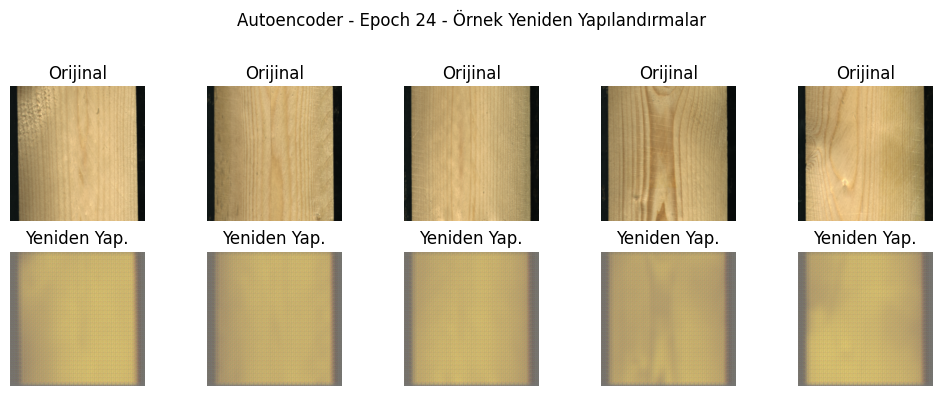

Epoch [25/60], Batch [1/5], Anlık Kayıp: 0.0250
Epoch [25/60], Batch [2/5], Anlık Kayıp: 0.0216
Epoch [25/60], Batch [3/5], Anlık Kayıp: 0.0213
Epoch [25/60], Batch [4/5], Anlık Kayıp: 0.0211
Epoch [25/60], Batch [5/5], Anlık Kayıp: 0.0213
Epoch [25/60] tamamlandı. Ortalama Eğitim Kaybı: 0.022185
Epoch [26/60], Batch [1/5], Anlık Kayıp: 0.0241
Epoch [26/60], Batch [2/5], Anlık Kayıp: 0.0206
Epoch [26/60], Batch [3/5], Anlık Kayıp: 0.0203
Epoch [26/60], Batch [4/5], Anlık Kayıp: 0.0203
Epoch [26/60], Batch [5/5], Anlık Kayıp: 0.0199
Epoch [26/60] tamamlandı. Ortalama Eğitim Kaybı: 0.021209
Epoch [27/60], Batch [1/5], Anlık Kayıp: 0.0198
Epoch [27/60], Batch [2/5], Anlık Kayıp: 0.0226
Epoch [27/60], Batch [3/5], Anlık Kayıp: 0.0193
Epoch [27/60], Batch [4/5], Anlık Kayıp: 0.0195
Epoch [27/60], Batch [5/5], Anlık Kayıp: 0.0196
Epoch [27/60] tamamlandı. Ortalama Eğitim Kaybı: 0.020223
Epoch [28/60], Batch [1/5], Anlık Kayıp: 0.0194
Epoch [28/60], Batch [2/5], Anlık Kayıp: 0.0187
Epoch [28/

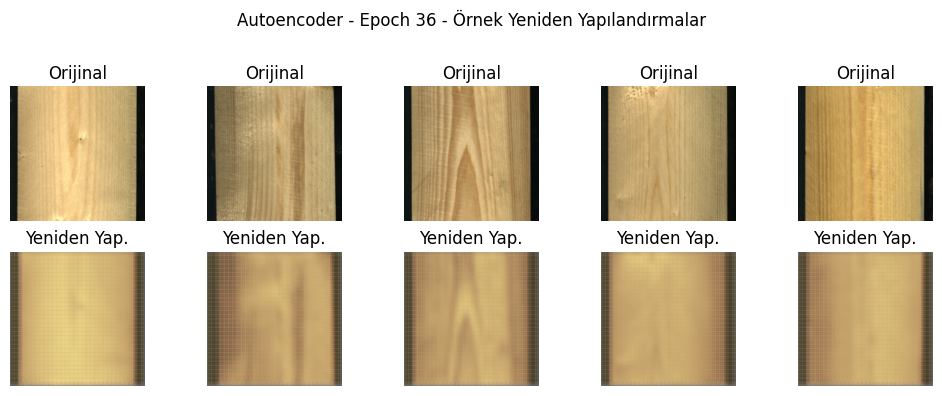

Epoch [37/60], Batch [1/5], Anlık Kayıp: 0.0134
Epoch [37/60], Batch [2/5], Anlık Kayıp: 0.0118
Epoch [37/60], Batch [3/5], Anlık Kayıp: 0.0118
Epoch [37/60], Batch [4/5], Anlık Kayıp: 0.0115
Epoch [37/60], Batch [5/5], Anlık Kayıp: 0.0113
Epoch [37/60] tamamlandı. Ortalama Eğitim Kaybı: 0.012026
Epoch [38/60], Batch [1/5], Anlık Kayıp: 0.0111
Epoch [38/60], Batch [2/5], Anlık Kayıp: 0.0110
Epoch [38/60], Batch [3/5], Anlık Kayıp: 0.0114
Epoch [38/60], Batch [4/5], Anlık Kayıp: 0.0123
Epoch [38/60], Batch [5/5], Anlık Kayıp: 0.0104
Epoch [38/60] tamamlandı. Ortalama Eğitim Kaybı: 0.011378
Epoch [39/60], Batch [1/5], Anlık Kayıp: 0.0106
Epoch [39/60], Batch [2/5], Anlık Kayıp: 0.0117
Epoch [39/60], Batch [3/5], Anlık Kayıp: 0.0106
Epoch [39/60], Batch [4/5], Anlık Kayıp: 0.0104
Epoch [39/60], Batch [5/5], Anlık Kayıp: 0.0105
Epoch [39/60] tamamlandı. Ortalama Eğitim Kaybı: 0.010787
Epoch [40/60], Batch [1/5], Anlık Kayıp: 0.0101
Epoch [40/60], Batch [2/5], Anlık Kayıp: 0.0099
Epoch [40/

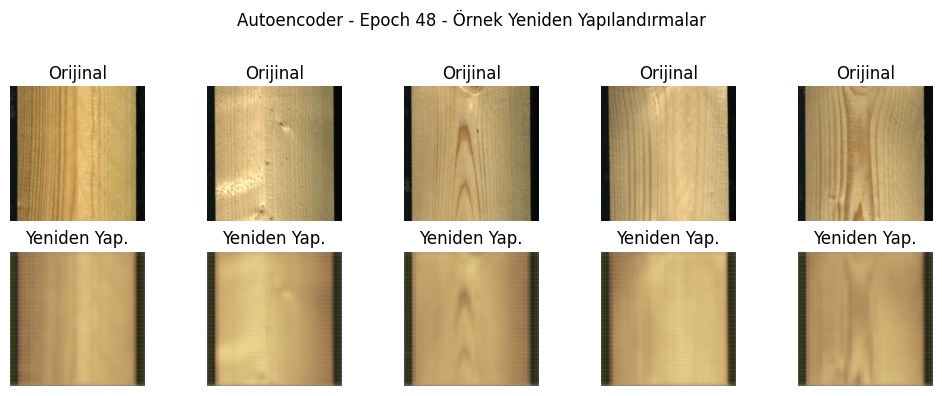

Epoch [49/60], Batch [1/5], Anlık Kayıp: 0.0063
Epoch [49/60], Batch [2/5], Anlık Kayıp: 0.0063
Epoch [49/60], Batch [3/5], Anlık Kayıp: 0.0064
Epoch [49/60], Batch [4/5], Anlık Kayıp: 0.0067
Epoch [49/60], Batch [5/5], Anlık Kayıp: 0.0061
Epoch [49/60] tamamlandı. Ortalama Eğitim Kaybı: 0.006389
Epoch [50/60], Batch [1/5], Anlık Kayıp: 0.0063
Epoch [50/60], Batch [2/5], Anlık Kayıp: 0.0066
Epoch [50/60], Batch [3/5], Anlık Kayıp: 0.0058
Epoch [50/60], Batch [4/5], Anlık Kayıp: 0.0057
Epoch [50/60], Batch [5/5], Anlık Kayıp: 0.0058
Epoch [50/60] tamamlandı. Ortalama Eğitim Kaybı: 0.006085
Epoch [51/60], Batch [1/5], Anlık Kayıp: 0.0056
Epoch [51/60], Batch [2/5], Anlık Kayıp: 0.0059
Epoch [51/60], Batch [3/5], Anlık Kayıp: 0.0063
Epoch [51/60], Batch [4/5], Anlık Kayıp: 0.0055
Epoch [51/60], Batch [5/5], Anlık Kayıp: 0.0056
Epoch [51/60] tamamlandı. Ortalama Eğitim Kaybı: 0.005796
Epoch [52/60], Batch [1/5], Anlık Kayıp: 0.0063
Epoch [52/60], Batch [2/5], Anlık Kayıp: 0.0054
Epoch [52/

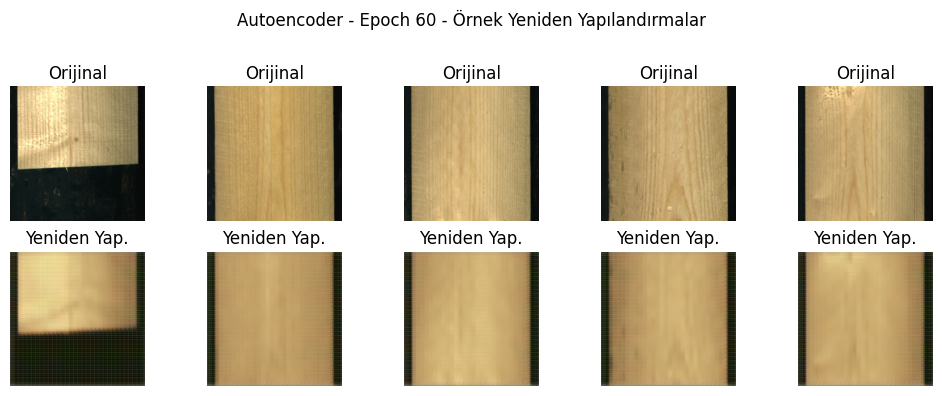

--- Autoencoder Modeli Eğitimi Tamamlandı ---


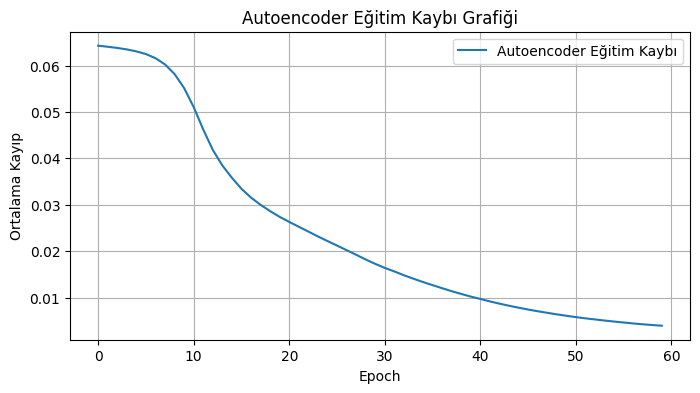

--- LCAE Modeli Eğitimi Başlıyor ---
Epoch [1/60], Batch [1/5], Anlık Kayıp: 0.0592
Epoch [1/60], Batch [2/5], Anlık Kayıp: 0.0570
Epoch [1/60], Batch [3/5], Anlık Kayıp: 0.0578
Epoch [1/60], Batch [4/5], Anlık Kayıp: 0.0586
Epoch [1/60], Batch [5/5], Anlık Kayıp: 0.0635
Epoch [1/60] tamamlandı. Ortalama Eğitim Kaybı: 0.058611
Epoch [2/60], Batch [1/5], Anlık Kayıp: 0.0582
Epoch [2/60], Batch [2/5], Anlık Kayıp: 0.0572
Epoch [2/60], Batch [3/5], Anlık Kayıp: 0.0613
Epoch [2/60], Batch [4/5], Anlık Kayıp: 0.0587
Epoch [2/60], Batch [5/5], Anlık Kayıp: 0.0519
Epoch [2/60] tamamlandı. Ortalama Eğitim Kaybı: 0.058265
Epoch [3/60], Batch [1/5], Anlık Kayıp: 0.0621
Epoch [3/60], Batch [2/5], Anlık Kayıp: 0.0561
Epoch [3/60], Batch [3/5], Anlık Kayıp: 0.0582
Epoch [3/60], Batch [4/5], Anlık Kayıp: 0.0564
Epoch [3/60], Batch [5/5], Anlık Kayıp: 0.0557
Epoch [3/60] tamamlandı. Ortalama Eğitim Kaybı: 0.057990
Epoch [4/60], Batch [1/5], Anlık Kayıp: 0.0582
Epoch [4/60], Batch [2/5], Anlık Kayıp: 

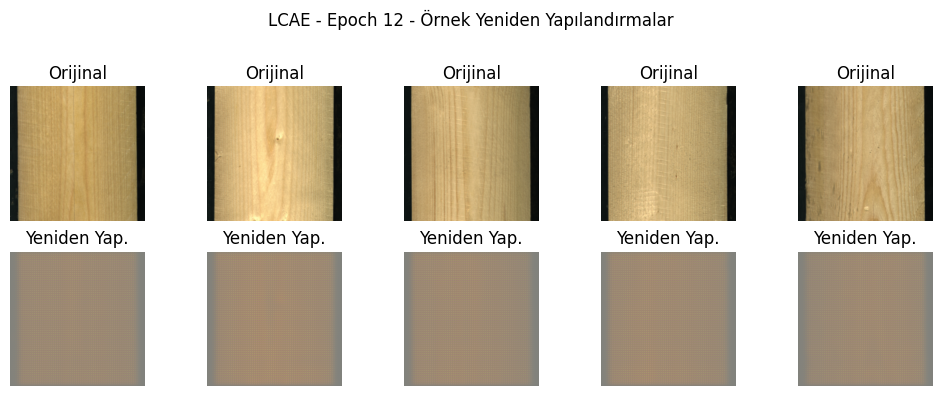

Epoch [13/60], Batch [1/5], Anlık Kayıp: 0.0422
Epoch [13/60], Batch [2/5], Anlık Kayıp: 0.0425
Epoch [13/60], Batch [3/5], Anlık Kayıp: 0.0426
Epoch [13/60], Batch [4/5], Anlık Kayıp: 0.0428
Epoch [13/60], Batch [5/5], Anlık Kayıp: 0.0417
Epoch [13/60] tamamlandı. Ortalama Eğitim Kaybı: 0.042466
Epoch [14/60], Batch [1/5], Anlık Kayıp: 0.0403
Epoch [14/60], Batch [2/5], Anlık Kayıp: 0.0402
Epoch [14/60], Batch [3/5], Anlık Kayıp: 0.0375
Epoch [14/60], Batch [4/5], Anlık Kayıp: 0.0385
Epoch [14/60], Batch [5/5], Anlık Kayıp: 0.0501
Epoch [14/60] tamamlandı. Ortalama Eğitim Kaybı: 0.040072
Epoch [15/60], Batch [1/5], Anlık Kayıp: 0.0420
Epoch [15/60], Batch [2/5], Anlık Kayıp: 0.0391
Epoch [15/60], Batch [3/5], Anlık Kayıp: 0.0380
Epoch [15/60], Batch [4/5], Anlık Kayıp: 0.0354
Epoch [15/60], Batch [5/5], Anlık Kayıp: 0.0350
Epoch [15/60] tamamlandı. Ortalama Eğitim Kaybı: 0.038303
Epoch [16/60], Batch [1/5], Anlık Kayıp: 0.0369
Epoch [16/60], Batch [2/5], Anlık Kayıp: 0.0414
Epoch [16/

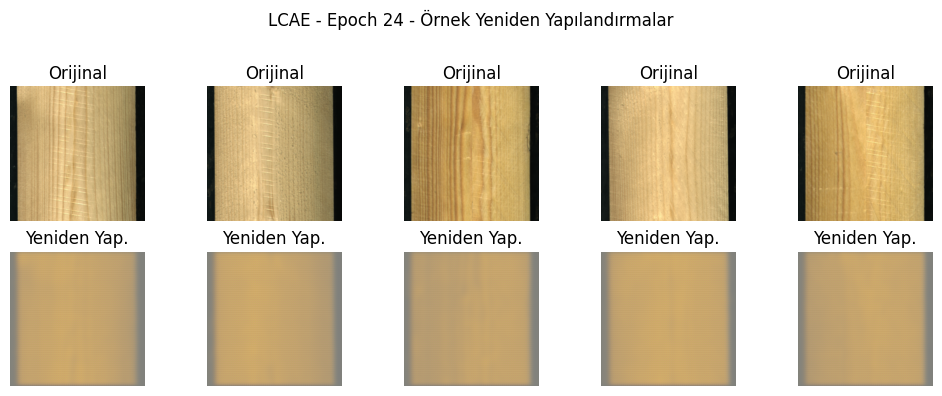

Epoch [25/60], Batch [1/5], Anlık Kayıp: 0.0299
Epoch [25/60], Batch [2/5], Anlık Kayıp: 0.0347
Epoch [25/60], Batch [3/5], Anlık Kayıp: 0.0294
Epoch [25/60], Batch [4/5], Anlık Kayıp: 0.0295
Epoch [25/60], Batch [5/5], Anlık Kayıp: 0.0301
Epoch [25/60] tamamlandı. Ortalama Eğitim Kaybı: 0.030811
Epoch [26/60], Batch [1/5], Anlık Kayıp: 0.0295
Epoch [26/60], Batch [2/5], Anlık Kayıp: 0.0295
Epoch [26/60], Batch [3/5], Anlık Kayıp: 0.0339
Epoch [26/60], Batch [4/5], Anlık Kayıp: 0.0296
Epoch [26/60], Batch [5/5], Anlık Kayıp: 0.0296
Epoch [26/60] tamamlandı. Ortalama Eğitim Kaybı: 0.030550
Epoch [27/60], Batch [1/5], Anlık Kayıp: 0.0293
Epoch [27/60], Batch [2/5], Anlık Kayıp: 0.0342
Epoch [27/60], Batch [3/5], Anlık Kayıp: 0.0288
Epoch [27/60], Batch [4/5], Anlık Kayıp: 0.0293
Epoch [27/60], Batch [5/5], Anlık Kayıp: 0.0293
Epoch [27/60] tamamlandı. Ortalama Eğitim Kaybı: 0.030306
Epoch [28/60], Batch [1/5], Anlık Kayıp: 0.0287
Epoch [28/60], Batch [2/5], Anlık Kayıp: 0.0340
Epoch [28/

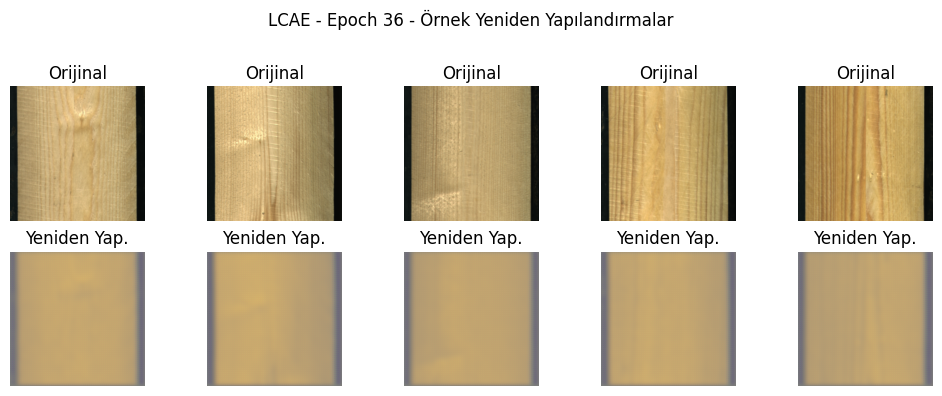

Epoch [37/60], Batch [1/5], Anlık Kayıp: 0.0244
Epoch [37/60], Batch [2/5], Anlık Kayıp: 0.0250
Epoch [37/60], Batch [3/5], Anlık Kayıp: 0.0270
Epoch [37/60], Batch [4/5], Anlık Kayıp: 0.0247
Epoch [37/60], Batch [5/5], Anlık Kayıp: 0.0226
Epoch [37/60] tamamlandı. Ortalama Eğitim Kaybı: 0.025012
Epoch [38/60], Batch [1/5], Anlık Kayıp: 0.0233
Epoch [38/60], Batch [2/5], Anlık Kayıp: 0.0264
Epoch [38/60], Batch [3/5], Anlık Kayıp: 0.0222
Epoch [38/60], Batch [4/5], Anlık Kayıp: 0.0226
Epoch [38/60], Batch [5/5], Anlık Kayıp: 0.0237
Epoch [38/60] tamamlandı. Ortalama Eğitim Kaybı: 0.023633
Epoch [39/60], Batch [1/5], Anlık Kayıp: 0.0230
Epoch [39/60], Batch [2/5], Anlık Kayıp: 0.0218
Epoch [39/60], Batch [3/5], Anlık Kayıp: 0.0211
Epoch [39/60], Batch [4/5], Anlık Kayıp: 0.0228
Epoch [39/60], Batch [5/5], Anlık Kayıp: 0.0199
Epoch [39/60] tamamlandı. Ortalama Eğitim Kaybı: 0.021987
Epoch [40/60], Batch [1/5], Anlık Kayıp: 0.0201
Epoch [40/60], Batch [2/5], Anlık Kayıp: 0.0198
Epoch [40/

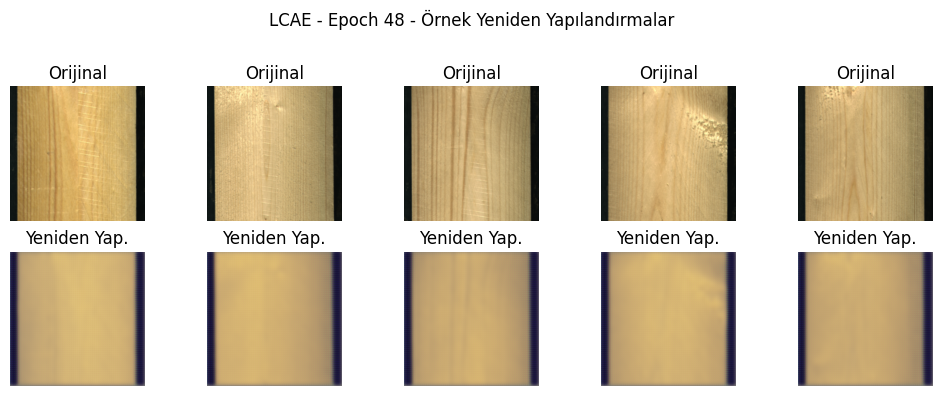

Epoch [49/60], Batch [1/5], Anlık Kayıp: 0.0074
Epoch [49/60], Batch [2/5], Anlık Kayıp: 0.0081
Epoch [49/60], Batch [3/5], Anlık Kayıp: 0.0073
Epoch [49/60], Batch [4/5], Anlık Kayıp: 0.0070
Epoch [49/60], Batch [5/5], Anlık Kayıp: 0.0065
Epoch [49/60] tamamlandı. Ortalama Eğitim Kaybı: 0.007360
Epoch [50/60], Batch [1/5], Anlık Kayıp: 0.0074
Epoch [50/60], Batch [2/5], Anlık Kayıp: 0.0067
Epoch [50/60], Batch [3/5], Anlık Kayıp: 0.0069
Epoch [50/60], Batch [4/5], Anlık Kayıp: 0.0063
Epoch [50/60], Batch [5/5], Anlık Kayıp: 0.0078
Epoch [50/60] tamamlandı. Ortalama Eğitim Kaybı: 0.006930
Epoch [51/60], Batch [1/5], Anlık Kayıp: 0.0065
Epoch [51/60], Batch [2/5], Anlık Kayıp: 0.0067
Epoch [51/60], Batch [3/5], Anlık Kayıp: 0.0061
Epoch [51/60], Batch [4/5], Anlık Kayıp: 0.0065
Epoch [51/60], Batch [5/5], Anlık Kayıp: 0.0058
Epoch [51/60] tamamlandı. Ortalama Eğitim Kaybı: 0.006411
Epoch [52/60], Batch [1/5], Anlık Kayıp: 0.0064
Epoch [52/60], Batch [2/5], Anlık Kayıp: 0.0064
Epoch [52/

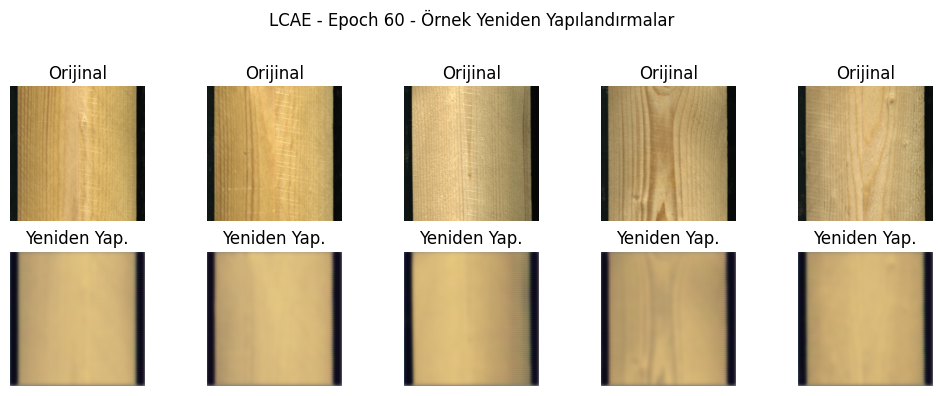

--- LCAE Modeli Eğitimi Tamamlandı ---


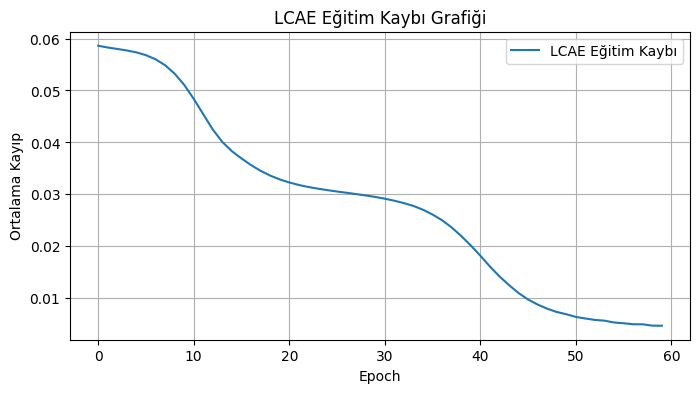

--- MemoryBankModel Modeli Eğitimi Başlıyor ---
Epoch [1/60], Batch [1/5], Anlık Kayıp: 0.0718
Epoch [1/60], Batch [2/5], Anlık Kayıp: 0.0657
Epoch [1/60], Batch [3/5], Anlık Kayıp: 0.0708
Epoch [1/60], Batch [4/5], Anlık Kayıp: 0.0703
Epoch [1/60], Batch [5/5], Anlık Kayıp: 0.0706
Epoch [1/60] tamamlandı. Ortalama Eğitim Kaybı: 0.069730
Epoch [2/60], Batch [1/5], Anlık Kayıp: 0.0691
Epoch [2/60], Batch [2/5], Anlık Kayıp: 0.0739
Epoch [2/60], Batch [3/5], Anlık Kayıp: 0.0659
Epoch [2/60], Batch [4/5], Anlık Kayıp: 0.0696
Epoch [2/60], Batch [5/5], Anlık Kayıp: 0.0669
Epoch [2/60] tamamlandı. Ortalama Eğitim Kaybı: 0.069393
Epoch [3/60], Batch [1/5], Anlık Kayıp: 0.0720
Epoch [3/60], Batch [2/5], Anlık Kayıp: 0.0688
Epoch [3/60], Batch [3/5], Anlık Kayıp: 0.0686
Epoch [3/60], Batch [4/5], Anlık Kayıp: 0.0683
Epoch [3/60], Batch [5/5], Anlık Kayıp: 0.0652
Epoch [3/60] tamamlandı. Ortalama Eğitim Kaybı: 0.069063
Epoch [4/60], Batch [1/5], Anlık Kayıp: 0.0655
Epoch [4/60], Batch [2/5], An

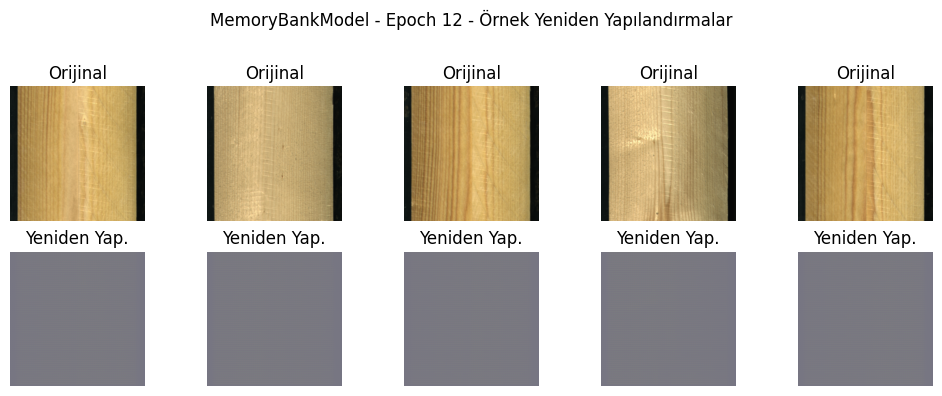

Epoch [13/60], Batch [1/5], Anlık Kayıp: 0.0623
Epoch [13/60], Batch [2/5], Anlık Kayıp: 0.0640
Epoch [13/60], Batch [3/5], Anlık Kayıp: 0.0626
Epoch [13/60], Batch [4/5], Anlık Kayıp: 0.0682
Epoch [13/60], Batch [5/5], Anlık Kayıp: 0.0648
Epoch [13/60] tamamlandı. Ortalama Eğitim Kaybı: 0.064319
Epoch [14/60], Batch [1/5], Anlık Kayıp: 0.0642
Epoch [14/60], Batch [2/5], Anlık Kayıp: 0.0624
Epoch [14/60], Batch [3/5], Anlık Kayıp: 0.0648
Epoch [14/60], Batch [4/5], Anlık Kayıp: 0.0639
Epoch [14/60], Batch [5/5], Anlık Kayıp: 0.0592
Epoch [14/60] tamamlandı. Ortalama Eğitim Kaybı: 0.063424
Epoch [15/60], Batch [1/5], Anlık Kayıp: 0.0688
Epoch [15/60], Batch [2/5], Anlık Kayıp: 0.0637
Epoch [15/60], Batch [3/5], Anlık Kayıp: 0.0605
Epoch [15/60], Batch [4/5], Anlık Kayıp: 0.0579
Epoch [15/60], Batch [5/5], Anlık Kayıp: 0.0593
Epoch [15/60] tamamlandı. Ortalama Eğitim Kaybı: 0.062443
Epoch [16/60], Batch [1/5], Anlık Kayıp: 0.0688
Epoch [16/60], Batch [2/5], Anlık Kayıp: 0.0576
Epoch [16/

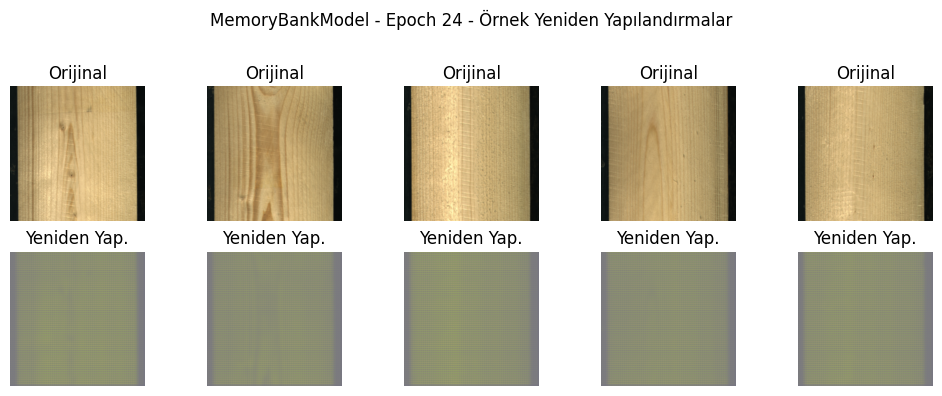

Epoch [25/60], Batch [1/5], Anlık Kayıp: 0.0497
Epoch [25/60], Batch [2/5], Anlık Kayıp: 0.0513
Epoch [25/60], Batch [3/5], Anlık Kayıp: 0.0483
Epoch [25/60], Batch [4/5], Anlık Kayıp: 0.0506
Epoch [25/60], Batch [5/5], Anlık Kayıp: 0.0513
Epoch [25/60] tamamlandı. Ortalama Eğitim Kaybı: 0.050090
Epoch [26/60], Batch [1/5], Anlık Kayıp: 0.0470
Epoch [26/60], Batch [2/5], Anlık Kayıp: 0.0481
Epoch [26/60], Batch [3/5], Anlık Kayıp: 0.0501
Epoch [26/60], Batch [4/5], Anlık Kayıp: 0.0475
Epoch [26/60], Batch [5/5], Anlık Kayıp: 0.0579
Epoch [26/60] tamamlandı. Ortalama Eğitim Kaybı: 0.049009
Epoch [27/60], Batch [1/5], Anlık Kayıp: 0.0491
Epoch [27/60], Batch [2/5], Anlık Kayıp: 0.0465
Epoch [27/60], Batch [3/5], Anlık Kayıp: 0.0461
Epoch [27/60], Batch [4/5], Anlık Kayıp: 0.0506
Epoch [27/60], Batch [5/5], Anlık Kayıp: 0.0468
Epoch [27/60] tamamlandı. Ortalama Eğitim Kaybı: 0.047977
Epoch [28/60], Batch [1/5], Anlık Kayıp: 0.0468
Epoch [28/60], Batch [2/5], Anlık Kayıp: 0.0501
Epoch [28/

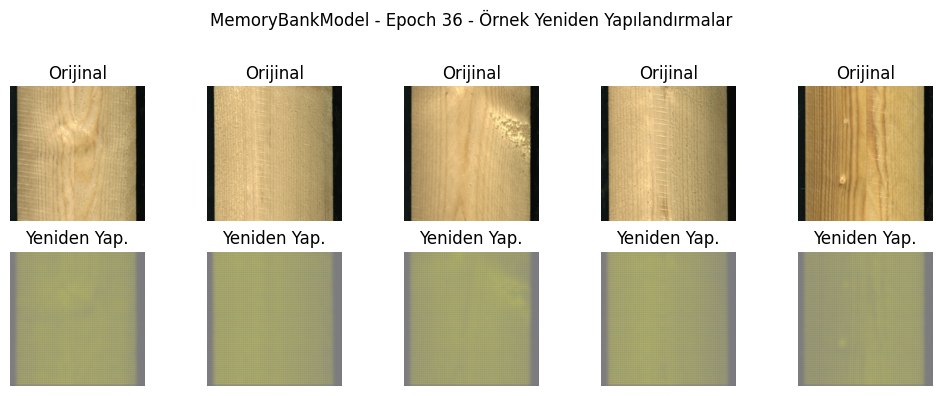

Epoch [37/60], Batch [1/5], Anlık Kayıp: 0.0396
Epoch [37/60], Batch [2/5], Anlık Kayıp: 0.0395
Epoch [37/60], Batch [3/5], Anlık Kayıp: 0.0445
Epoch [37/60], Batch [4/5], Anlık Kayıp: 0.0398
Epoch [37/60], Batch [5/5], Anlık Kayıp: 0.0373
Epoch [37/60] tamamlandı. Ortalama Eğitim Kaybı: 0.040532
Epoch [38/60], Batch [1/5], Anlık Kayıp: 0.0385
Epoch [38/60], Batch [2/5], Anlık Kayıp: 0.0391
Epoch [38/60], Batch [3/5], Anlık Kayıp: 0.0410
Epoch [38/60], Batch [4/5], Anlık Kayıp: 0.0416
Epoch [38/60], Batch [5/5], Anlık Kayıp: 0.0388
Epoch [38/60] tamamlandı. Ortalama Eğitim Kaybı: 0.039957
Epoch [39/60], Batch [1/5], Anlık Kayıp: 0.0396
Epoch [39/60], Batch [2/5], Anlık Kayıp: 0.0372
Epoch [39/60], Batch [3/5], Anlık Kayıp: 0.0399
Epoch [39/60], Batch [4/5], Anlık Kayıp: 0.0414
Epoch [39/60], Batch [5/5], Anlık Kayıp: 0.0381
Epoch [39/60] tamamlandı. Ortalama Eğitim Kaybı: 0.039394
Epoch [40/60], Batch [1/5], Anlık Kayıp: 0.0387
Epoch [40/60], Batch [2/5], Anlık Kayıp: 0.0369
Epoch [40/

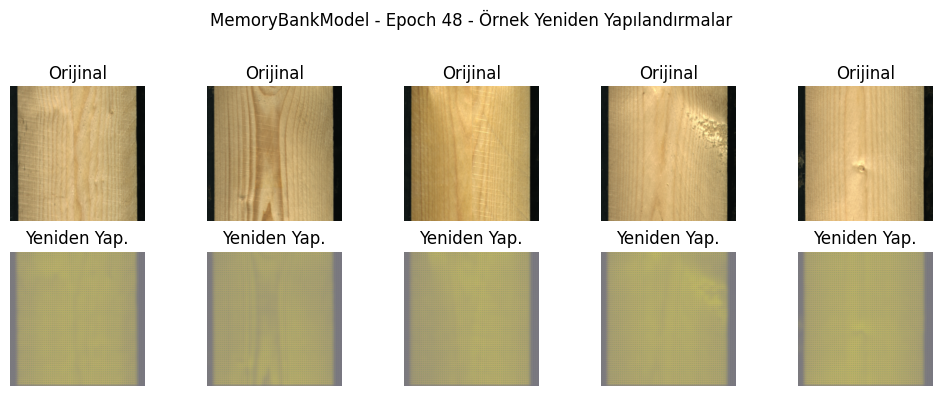

Epoch [49/60], Batch [1/5], Anlık Kayıp: 0.0338
Epoch [49/60], Batch [2/5], Anlık Kayıp: 0.0344
Epoch [49/60], Batch [3/5], Anlık Kayıp: 0.0333
Epoch [49/60], Batch [4/5], Anlık Kayıp: 0.0363
Epoch [49/60], Batch [5/5], Anlık Kayıp: 0.0343
Epoch [49/60] tamamlandı. Ortalama Eğitim Kaybı: 0.034429
Epoch [50/60], Batch [1/5], Anlık Kayıp: 0.0329
Epoch [50/60], Batch [2/5], Anlık Kayıp: 0.0380
Epoch [50/60], Batch [3/5], Anlık Kayıp: 0.0328
Epoch [50/60], Batch [4/5], Anlık Kayıp: 0.0327
Epoch [50/60], Batch [5/5], Anlık Kayıp: 0.0325
Epoch [50/60] tamamlandı. Ortalama Eğitim Kaybı: 0.033983
Epoch [51/60], Batch [1/5], Anlık Kayıp: 0.0324
Epoch [51/60], Batch [2/5], Anlık Kayıp: 0.0341
Epoch [51/60], Batch [3/5], Anlık Kayıp: 0.0319
Epoch [51/60], Batch [4/5], Anlık Kayıp: 0.0362
Epoch [51/60], Batch [5/5], Anlık Kayıp: 0.0325
Epoch [51/60] tamamlandı. Ortalama Eğitim Kaybı: 0.033548
Epoch [52/60], Batch [1/5], Anlık Kayıp: 0.0315
Epoch [52/60], Batch [2/5], Anlık Kayıp: 0.0338
Epoch [52/

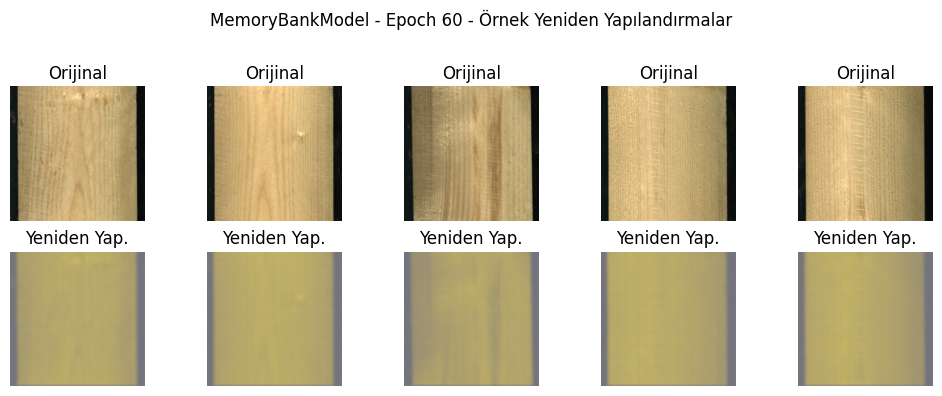

--- MemoryBankModel Modeli Eğitimi Tamamlandı ---


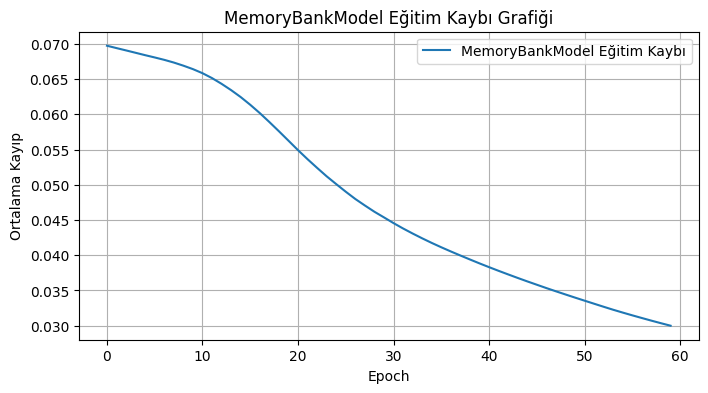

In [10]:
# ========================== MODELLERİN EĞİTİMİ ==========================

def train_model(model, model_name, train_loader, criterion, optimizer, num_epochs=EPOCHS):
    print(f"--- {model_name} Modeli Eğitimi Başlıyor ---")
    model.train()
    epoch_losses = []
    if len(train_loader.dataset) == 0:
        print(f"Uyarı: {model_name} için eğitim verisi bulunamadı. Eğitim atlanıyor.")
        return epoch_losses

    for epoch in range(num_epochs):
        running_loss = 0.0
        for batch_idx, (images, _, _) in enumerate(train_loader):
            images = images.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, images)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * images.size(0)
            if (batch_idx + 1) % (max(1, len(train_loader) // 5)) == 0:
                 print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}], Anlık Kayıp: {loss.item():.4f}")

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_losses.append(epoch_loss)
        print(f"Epoch [{epoch+1}/{num_epochs}] tamamlandı. Ortalama Eğitim Kaybı: {epoch_loss:.6f}")

        if (epoch + 1) % max(1, (num_epochs // 5)) == 0 or epoch == num_epochs - 1:
            model.eval()
            with torch.no_grad():
                sample_images, _, _ = next(iter(train_loader))
                sample_images = sample_images.to(device)
                reconstructed_samples = model(sample_images)
                fig, axes = plt.subplots(2, min(5, sample_images.size(0)), figsize=(10, 4))
                fig.suptitle(f'{model_name} - Epoch {epoch+1} - Örnek Yeniden Yapılandırmalar')
                for i in range(min(5, sample_images.size(0))):
                    axes[0, i].imshow(sample_images[i].cpu().permute(1, 2, 0).numpy())
                    axes[0, i].set_title("Orijinal")
                    axes[0, i].axis('off')
                    axes[1, i].imshow(reconstructed_samples[i].cpu().permute(1, 2, 0).numpy())
                    axes[1, i].set_title("Yeniden Yap.")
                    axes[1, i].axis('off')
                plt.tight_layout(rect=[0, 0, 1, 0.96])
                plt.show()
            model.train()

    print(f"--- {model_name} Modeli Eğitimi Tamamlandı ---")
    return epoch_losses

trained_models_losses = {}
if len(train_loader.dataset) > 0:
    for model_name, model_instance in models_dict.items():
        losses = train_model(model_instance, model_name, train_loader,
                             criterions[model_name], optimizers[model_name], num_epochs=EPOCHS)
        trained_models_losses[model_name] = losses
        if losses:
            plt.figure(figsize=(8, 4))
            plt.plot(losses, label=f'{model_name} Eğitim Kaybı')
            plt.xlabel("Epoch")
            plt.ylabel("Ortalama Kayıp")
            plt.title(f"{model_name} Eğitim Kaybı Grafiği")
            plt.legend()
            plt.grid(True)
            plt.show()
        # torch.save(model_instance.state_dict(), f"{model_name}_wood_anomaly_epochs{EPOCHS}.pth")
else:
    print("Eğitim verisi olmadığından modeller eğitilemedi.")



Model: Autoencoder için IoU debug modu etkinleştiriliyor...
--- Autoencoder Modeli Değerlendirmesi Başlıyor ---
Optimal Eşik (F1): 0.003811, Max F1: 0.7821, ROC AUC: 0.8252
Anomali haritası değer aralığı: [0.000000, 0.241185]
GT Mask nonzeros: 1143, Pred Mask (0.000000) nonzeros: 65536

--- FARKLI EŞİKLERİN IoU DEĞERLERİ ---
Eşik         | Ortalama IoU   
------------------------------
0.000000     | 0.0248         
0.003811     | 0.0529         
0.021439     | 0.0424         
0.042877     | 0.0210         
0.064316     | 0.0122         
0.085755     | 0.0074         
0.107194     | 0.0040         
0.128632     | 0.0017         
0.150071     | 0.0006         
0.171510     | 0.0002         
0.192948     | 0.0000         

En İyi IoU Eşiği: 0.003811 (IoU: 0.0529)


<ipython-input-11-6b6826ed52d1>:160: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(list(avg_ious.keys()), list(avg_ious.values()), 'o-', marker='o')


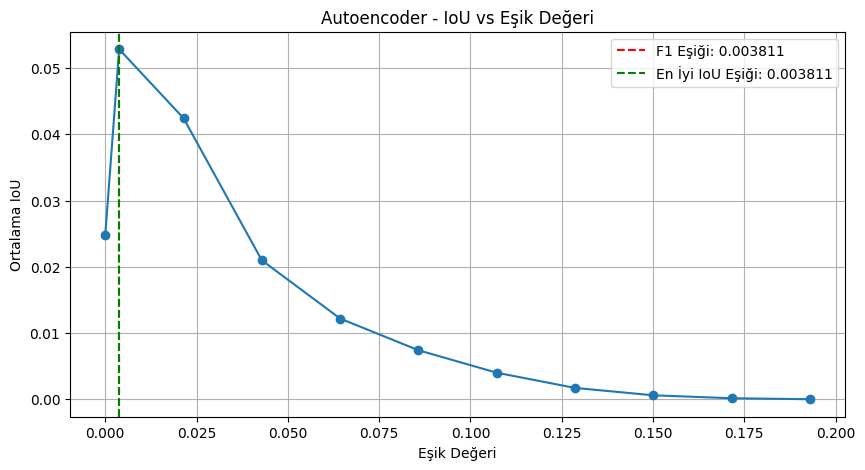

Ortalama IoU (Kusurlu Örnekler, F1 eşiği ile): 0.0529


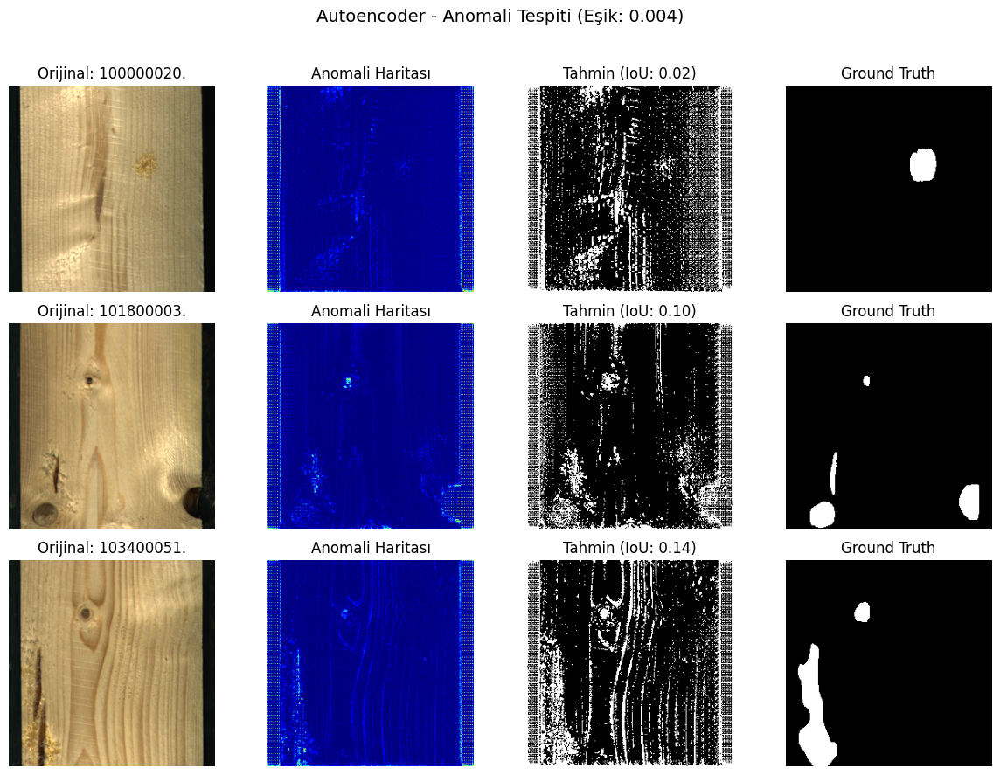

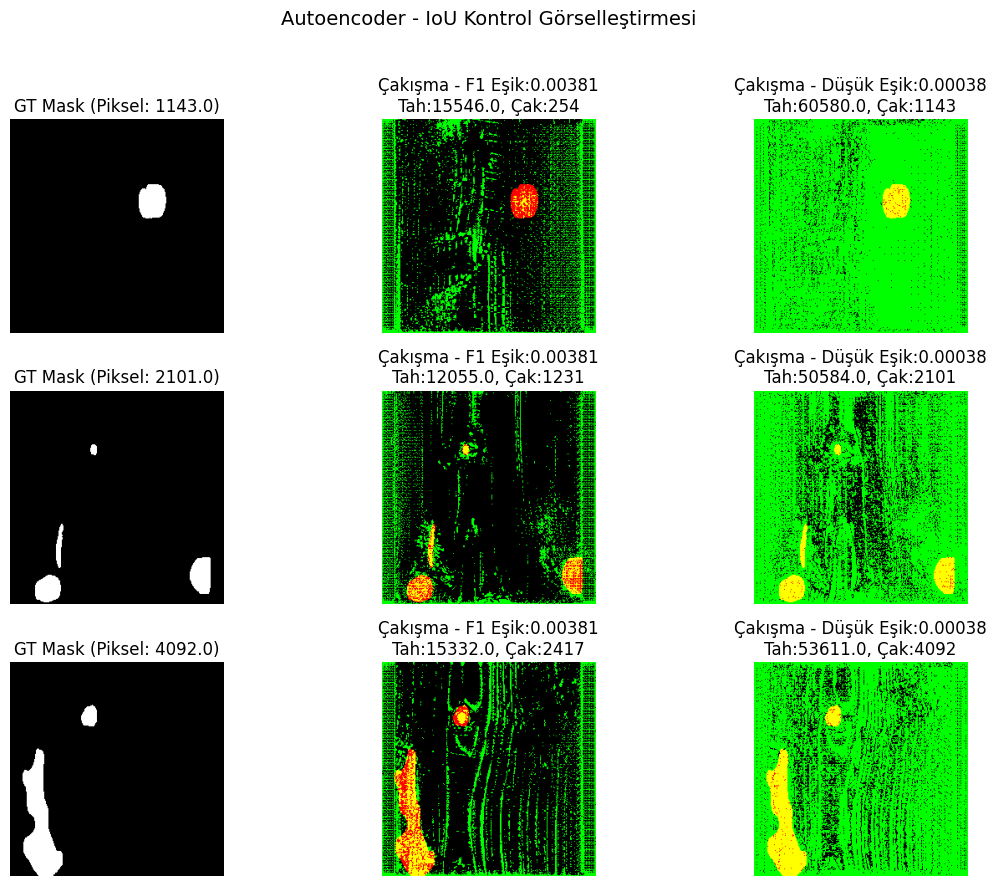

Autoencoder Sonuç: F1=0.7821, ROC_AUC=0.8252, Avg_IoU=0.0529, Eşik=0.003811

Model: LCAE için IoU debug modu etkinleştiriliyor...
--- LCAE Modeli Değerlendirmesi Başlıyor ---


<ipython-input-11-6b6826ed52d1>:64: RuntimeWarning: invalid value encountered in divide
  f1_scores_pr = np.nan_to_num((2 * precisions * recalls) / (precisions + recalls))


Optimal Eşik (F1): 0.003654, Max F1: 0.7292, ROC AUC: 0.6453
Anomali haritası değer aralığı: [0.000000, 0.210654]
GT Mask nonzeros: 1143, Pred Mask (0.000000) nonzeros: 65536

--- FARKLI EŞİKLERİN IoU DEĞERLERİ ---
Eşik         | Ortalama IoU   
------------------------------
0.000000     | 0.0248         
0.003654     | 0.0550         
0.018725     | 0.0774         
0.037450     | 0.0477         
0.056175     | 0.0282         
0.074899     | 0.0172         
0.093624     | 0.0107         
0.112349     | 0.0060         
0.131074     | 0.0032         
0.149799     | 0.0013         
0.168524     | 0.0005         

En İyi IoU Eşiği: 0.018725 (IoU: 0.0774)


<ipython-input-11-6b6826ed52d1>:160: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(list(avg_ious.keys()), list(avg_ious.values()), 'o-', marker='o')


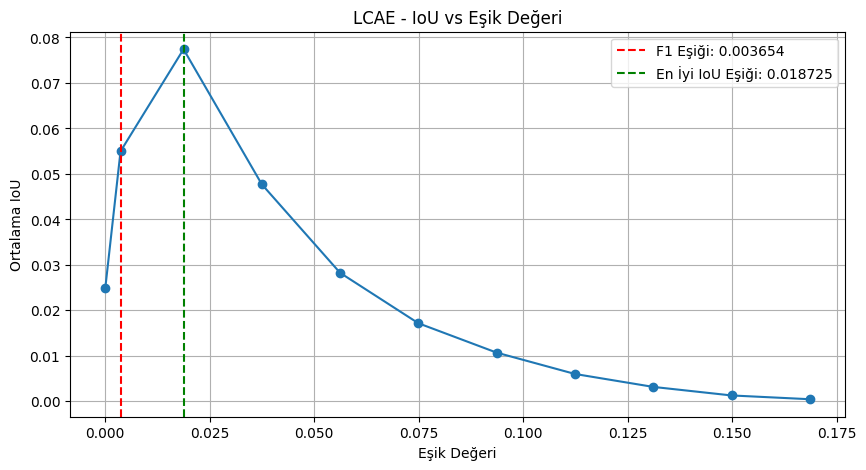

Ortalama IoU (Kusurlu Örnekler, F1 eşiği ile): 0.0550


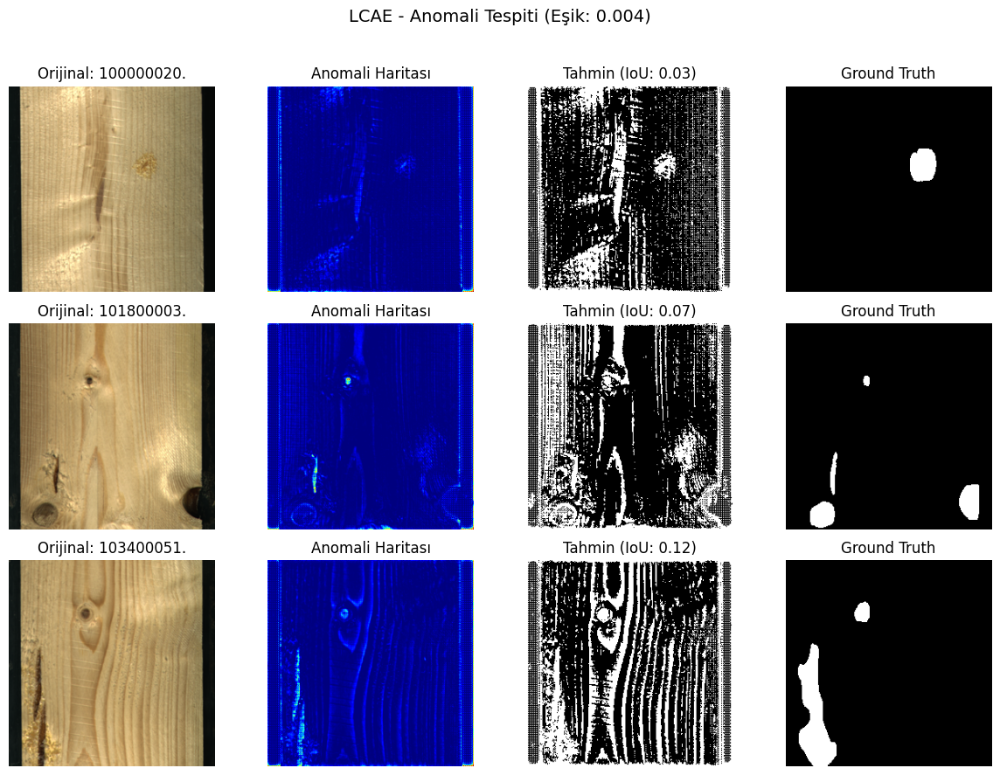

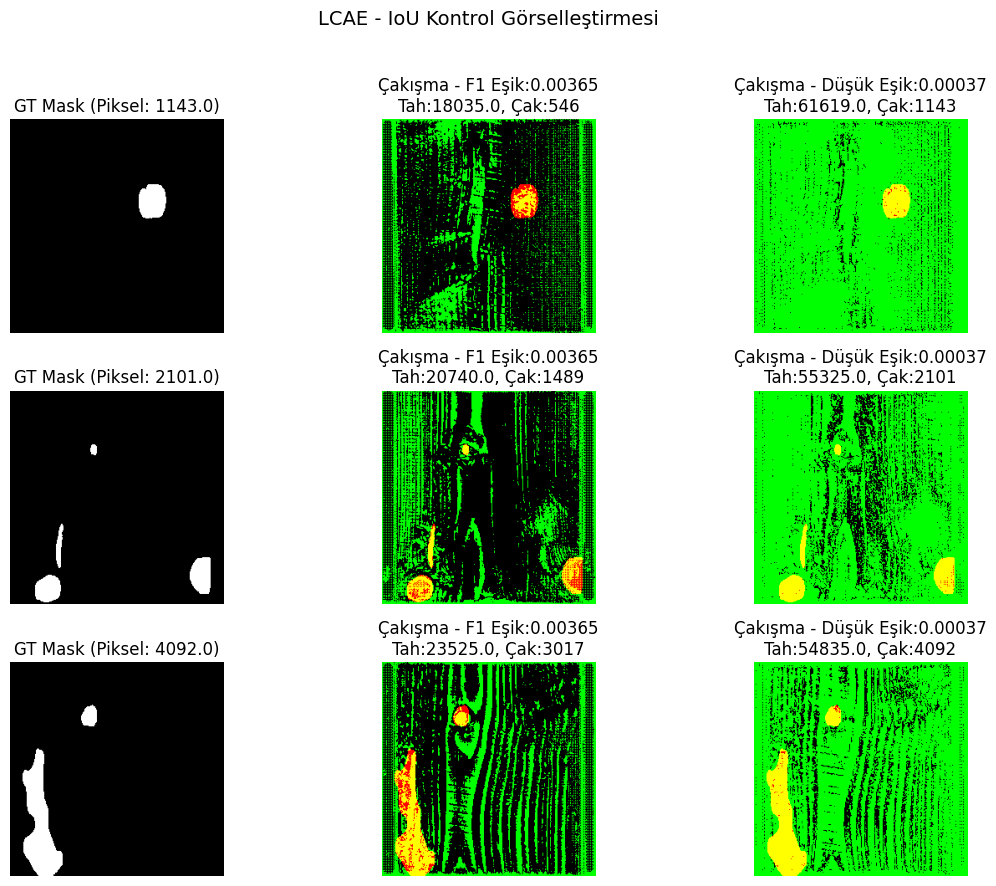

LCAE Sonuç: F1=0.7292, ROC_AUC=0.6453, Avg_IoU=0.0550, Eşik=0.003654

Model: MemoryBankModel için IoU debug modu etkinleştiriliyor...
--- MemoryBankModel Modeli Değerlendirmesi Başlıyor ---


<ipython-input-11-6b6826ed52d1>:64: RuntimeWarning: invalid value encountered in divide
  f1_scores_pr = np.nan_to_num((2 * precisions * recalls) / (precisions + recalls))


Optimal Eşik (F1): 0.025998, Max F1: 0.6900, ROC AUC: 0.6419
Anomali haritası değer aralığı: [0.000000, 0.339626]
GT Mask nonzeros: 1143, Pred Mask (0.000000) nonzeros: 65535

--- FARKLI EŞİKLERİN IoU DEĞERLERİ ---
Eşik         | Ortalama IoU   
------------------------------
0.000000     | 0.0248         
0.025998     | 0.0401         
0.030189     | 0.0379         
0.060378     | 0.0179         
0.090567     | 0.0094         
0.120756     | 0.0057         
0.150945     | 0.0038         
0.181134     | 0.0030         
0.211323     | 0.0018         
0.241512     | 0.0004         
0.271701     | 0.0000         

En İyi IoU Eşiği: 0.025998 (IoU: 0.0401)


<ipython-input-11-6b6826ed52d1>:160: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(list(avg_ious.keys()), list(avg_ious.values()), 'o-', marker='o')


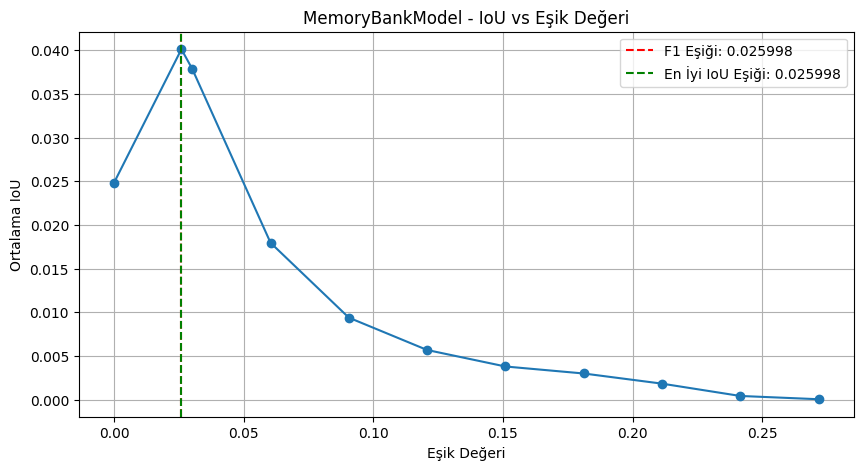

Ortalama IoU (Kusurlu Örnekler, F1 eşiği ile): 0.0401


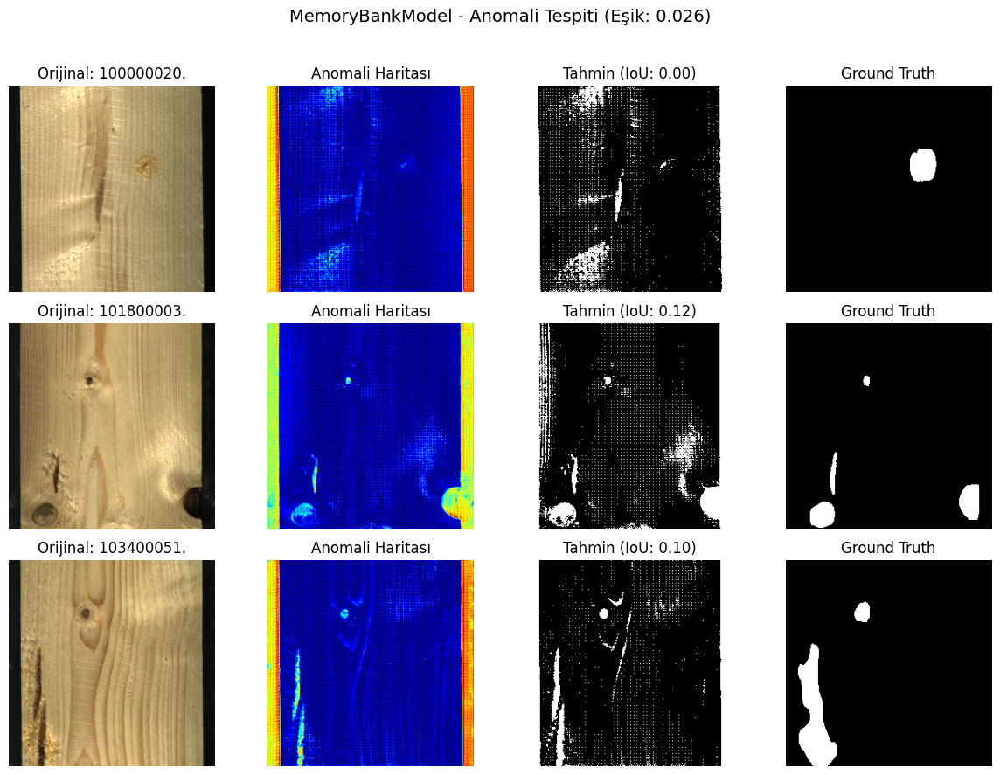

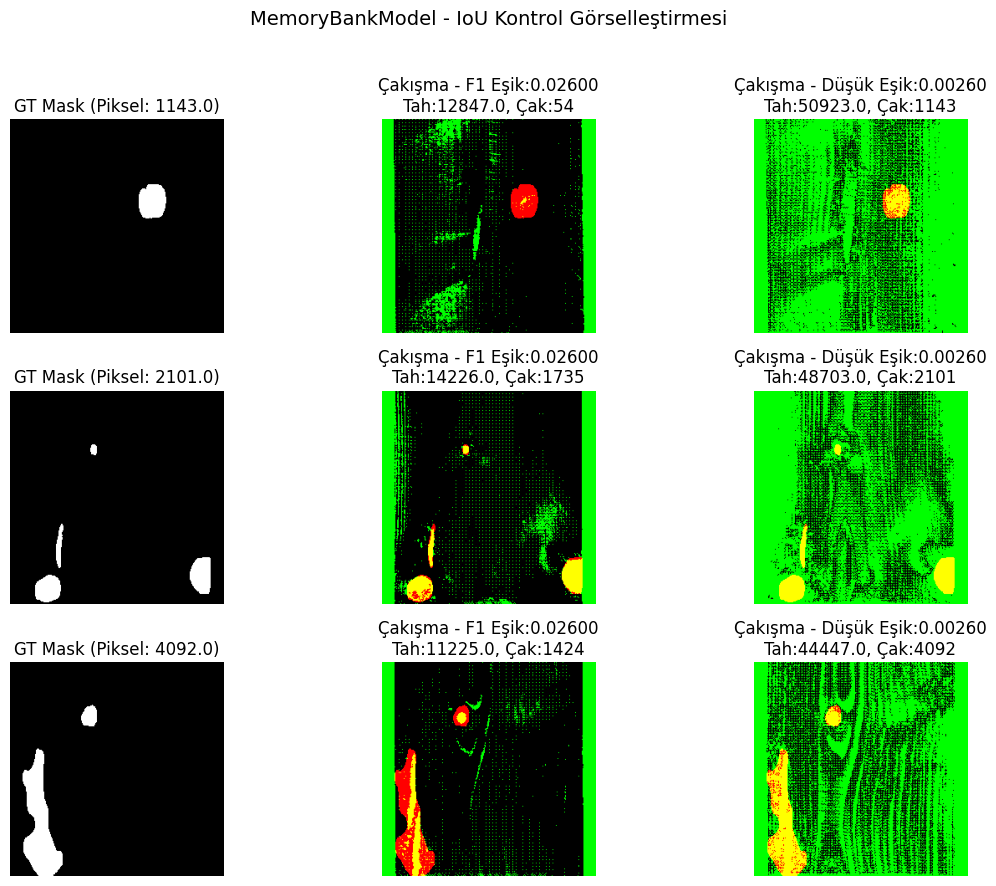

MemoryBankModel Sonuç: F1=0.6900, ROC_AUC=0.6419, Avg_IoU=0.0401, Eşik=0.025998


In [11]:
# ========================== MODELLERİN DEĞERLENDİRİLMESİ ==========================

from sklearn.metrics import roc_curve, auc, precision_recall_curve
import matplotlib.pyplot as plt

def evaluate_model(model, model_name, test_good_loader, test_defect_loader, criterion, device, debug_thresholds=False):
    print(f"--- {model_name} Modeli Değerlendirmesi Başlıyor ---")
    model.eval()
    all_scores, all_labels, all_image_paths = [], [], []
    defect_gt_masks_list, defect_pred_anomaly_maps_list, defect_image_paths = [], [], []

    # Normal test görüntüleri
    if len(test_good_loader.dataset) > 0:
        with torch.no_grad():
            for images, _, paths in test_good_loader:
                images = images.to(device)
                reconstructed = model(images)
                anomaly_maps_batch = F.mse_loss(reconstructed, images, reduction='none')
                scores_batch = torch.mean(anomaly_maps_batch, dim=(1, 2, 3))
                all_scores.extend(scores_batch.cpu().numpy())
                all_labels.extend([0] * images.size(0))
                all_image_paths.extend(paths)
    else:
        print(f"Uyarı: {model_name} için normal test verisi bulunamadı.")

    # Kusurlu test görüntüleri
    if len(test_defect_loader.dataset) > 0:
        with torch.no_grad():
            for images, gt_masks, paths in test_defect_loader:
                if images.nelement() == 0: continue
                images, gt_masks = images.to(device), gt_masks.to(device)
                reconstructed = model(images)
                anomaly_maps_batch = F.mse_loss(reconstructed, images, reduction='none')
                anomaly_maps_single_channel = torch.mean(anomaly_maps_batch, dim=1, keepdim=True)
                scores_batch = torch.mean(anomaly_maps_batch, dim=(1, 2, 3))

                all_scores.extend(scores_batch.cpu().numpy())
                all_labels.extend([1] * images.size(0))
                all_image_paths.extend(paths)
                defect_image_paths.extend(paths)
                defect_gt_masks_list.extend([m.cpu() for m in gt_masks])
                defect_pred_anomaly_maps_list.extend([am.cpu() for am in anomaly_maps_single_channel])

                # Debug: Kontrol amaçlı ilk örneğe bakalım
                if len(defect_gt_masks_list) == 1:  # İlk örnek için
                    print(f"Ground Truth Mask İstatistikleri: Min={gt_masks[0].min().item():.4f}, "
                          f"Max={gt_masks[0].max().item():.4f}, Mean={gt_masks[0].mean().item():.4f}, "
                          f"Sum={gt_masks[0].sum().item():.4f}, Shape={gt_masks[0].shape}")
                    print(f"Anomali Haritası İstatistikleri: Min={anomaly_maps_single_channel[0].min().item():.4f}, "
                          f"Max={anomaly_maps_single_channel[0].max().item():.4f}, "
                          f"Mean={anomaly_maps_single_channel[0].mean().item():.4f}, Shape={anomaly_maps_single_channel[0].shape}")
    else:
        print(f"Uyarı: {model_name} için kusurlu test verisi bulunamadı. F1 ve IoU etkilenebilir.")

    if not all_scores: # Eğer hiç skor yoksa (veri yoksa)
        print(f"{model_name}: Değerlendirme için hiç veri bulunamadı.")
        return 0, 0, 0, 0

    all_scores, all_labels = np.array(all_scores), np.array(all_labels)
    max_f1, best_threshold_f1, roc_auc = 0, np.median(all_scores) if all_scores.size > 0 else 0, 0

    if all_labels.size > 0 and np.any(all_labels == 1) and np.any(all_labels == 0): # Hem pozitif hem negatif örnek varsa
        precisions, recalls, thresholds_pr = precision_recall_curve(all_labels, all_scores)
        f1_scores_pr = np.nan_to_num((2 * precisions * recalls) / (precisions + recalls))
        if f1_scores_pr.size > 0:
            max_f1_idx = np.argmax(f1_scores_pr)
            max_f1 = f1_scores_pr[max_f1_idx]
            # thresholds_pr'ın boyutu f1_scores_pr'dan 1 eksik olabilir.
            best_threshold_f1 = thresholds_pr[max_f1_idx] if max_f1_idx < len(thresholds_pr) else (thresholds_pr[-1] if len(thresholds_pr)>0 else best_threshold_f1)

        fpr, tpr, _ = roc_curve(all_labels, all_scores)
        roc_auc = auc(fpr, tpr)
        print(f"Optimal Eşik (F1): {best_threshold_f1:.6f}, Max F1: {max_f1:.4f}, ROC AUC: {roc_auc:.4f}")
        # Grafikler (isteğe bağlı, çok fazla olabilir)
    elif all_labels.size > 0:
        print("F1/ROC AUC hesaplamak için hem normal hem de kusurlu örneklere ihtiyaç var.")
        # Sadece tek bir sınıf varsa, F1 ve ROC AUC anlamlı olmayabilir.
        # Bu durumda eşiği medyan olarak bırakabiliriz.

    # IoU Hesaplaması - Farklı eşiklerle test edilecek
    iou_scores = []
    all_pred_masks_for_iou_vis = []

    # Eşik değerlerini test etmek için
    thresholds_to_test = []
    threshold_results = {}

    if debug_thresholds:
        # Anomali haritalarının değer aralığı için
        anomaly_map_min = float('inf')
        anomaly_map_max = float('-inf')
        for am in defect_pred_anomaly_maps_list:
            anomaly_map_min = min(anomaly_map_min, am.min().item())
            anomaly_map_max = max(anomaly_map_max, am.max().item())

        # Min/max değerlere göre test eşiklerini belirle
        print(f"Anomali haritası değer aralığı: [{anomaly_map_min:.6f}, {anomaly_map_max:.6f}]")
        thresholds_to_test = np.linspace(anomaly_map_min, anomaly_map_max * 0.8, num=10).tolist()
        thresholds_to_test.extend([best_threshold_f1])  # F1'e göre belirlenen eşiği de ekle
        thresholds_to_test = sorted(set(thresholds_to_test))  # Unique ve sıralı

        threshold_results = {t: [] for t in thresholds_to_test}

    if defect_pred_anomaly_maps_list:
        for i in range(len(defect_pred_anomaly_maps_list)):
            pred_map_tensor = defect_pred_anomaly_maps_list[i]
            gt_mask_tensor = defect_gt_masks_list[i]

            # Eşik değişimleriyle IoU testleri
            if debug_thresholds:
                for threshold in thresholds_to_test:
                    pred_mask_binary = (pred_map_tensor > threshold).float()
                    pred_flat = pred_mask_binary.flatten().cpu().numpy().astype(int)
                    gt_flat = gt_mask_tensor.flatten().cpu().numpy().astype(int)

                    # IoU hesaplaması
                    if np.sum(gt_flat) == 0 and np.sum(pred_flat) == 0:
                        iou = 1.0
                    elif np.sum(gt_flat) == 0 and np.sum(pred_flat) > 0:
                        iou = 0.0
                    else:
                        iou = jaccard_score(gt_flat, pred_flat, average='binary', zero_division=0)

                    threshold_results[threshold].append(iou)

                    # Debug için bazı istatistikler
                    if i == 0 and threshold == thresholds_to_test[0]:  # İlk görüntü ilk eşik
                        print(f"GT Mask nonzeros: {np.sum(gt_flat)}, "
                              f"Pred Mask ({threshold:.6f}) nonzeros: {np.sum(pred_flat)}")

            # Normal IoU hesaplaması (best_threshold_f1 ile)
            pred_mask_binary = (pred_map_tensor > best_threshold_f1).float()
            all_pred_masks_for_iou_vis.append(pred_mask_binary.cpu())
            pred_flat = pred_mask_binary.flatten().cpu().numpy().astype(int)
            gt_flat = gt_mask_tensor.flatten().cpu().numpy().astype(int)

            if np.sum(gt_flat) == 0 and np.sum(pred_flat) == 0:
                iou = 1.0
            elif np.sum(gt_flat) == 0 and np.sum(pred_flat) > 0:
                iou = 0.0
            else:
                iou = jaccard_score(gt_flat, pred_flat, average='binary', zero_division=0)

            iou_scores.append(iou)

        # Farklı eşikler için ortalama IoU değerlerini göster
        if debug_thresholds:
            avg_ious = {t: np.mean(scores) for t, scores in threshold_results.items()}
            best_threshold = max(avg_ious.items(), key=lambda x: x[1])

            print("\n--- FARKLI EŞİKLERİN IoU DEĞERLERİ ---")
            print(f"{'Eşik':<12} | {'Ortalama IoU':<15}")
            print("-" * 30)
            for threshold, avg_iou in sorted(avg_ious.items()):
                print(f"{threshold:<12.6f} | {avg_iou:<15.4f}")
            print(f"\nEn İyi IoU Eşiği: {best_threshold[0]:.6f} (IoU: {best_threshold[1]:.4f})")

            # IoU vs Threshold grafiği
            plt.figure(figsize=(10, 5))
            plt.plot(list(avg_ious.keys()), list(avg_ious.values()), 'o-', marker='o')
            plt.axvline(x=best_threshold_f1, color='r', linestyle='--', label=f'F1 Eşiği: {best_threshold_f1:.6f}')
            plt.axvline(x=best_threshold[0], color='g', linestyle='--', label=f'En İyi IoU Eşiği: {best_threshold[0]:.6f}')
            plt.xlabel('Eşik Değeri')
            plt.ylabel('Ortalama IoU')
            plt.title(f'{model_name} - IoU vs Eşik Değeri')
            plt.grid(True)
            plt.legend()
            plt.show()

        avg_iou = np.mean(iou_scores) if iou_scores else 0
        print(f"Ortalama IoU (Kusurlu Örnekler, F1 eşiği ile): {avg_iou:.4f}")
    else:
        avg_iou = 0
        print("IoU için kusurlu örnek/tahmin haritası yok.")

    # Detaylı Görselleştirme (birkaç örnek)
    num_samples_to_show = min(3, len(defect_pred_anomaly_maps_list))
    if num_samples_to_show > 0:
        # 1. Normal görselleştirme
        fig, axes = plt.subplots(num_samples_to_show, 4, figsize=(12, 3 * num_samples_to_show))
        if num_samples_to_show == 1: axes = np.array([axes]) # Tek satırsa 2D yap
        fig.suptitle(f"{model_name} - Anomali Tespiti (Eşik: {best_threshold_f1:.3f})", fontsize=14)
        for i in range(num_samples_to_show):
            img_path = defect_image_paths[i]
            original_image = Image.open(img_path).convert("RGB").resize(IMG_SIZE)
            anomaly_map_vis = defect_pred_anomaly_maps_list[i].squeeze().cpu().numpy()
            pred_mask_vis = all_pred_masks_for_iou_vis[i].squeeze().cpu().numpy()
            gt_mask_vis = defect_gt_masks_list[i].squeeze().cpu().numpy()
            axes[i, 0].imshow(original_image); axes[i, 0].set_title(f"Orijinal: {os.path.basename(img_path)[:10]}"); axes[i, 0].axis('off')
            axes[i, 1].imshow(anomaly_map_vis, cmap='jet'); axes[i, 1].set_title("Anomali Haritası"); axes[i, 1].axis('off')
            axes[i, 2].imshow(pred_mask_vis, cmap='gray'); axes[i, 2].set_title(f"Tahmin (IoU: {iou_scores[i]:.2f})"); axes[i, 2].axis('off')
            axes[i, 3].imshow(gt_mask_vis, cmap='gray'); axes[i, 3].set_title("Ground Truth"); axes[i, 3].axis('off')
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

        # 2. IoU kontrol görselleştirmesi (tahmin ve ground truth'un çakışması)
        fig, axes = plt.subplots(num_samples_to_show, 3, figsize=(12, 3 * num_samples_to_show))
        if num_samples_to_show == 1: axes = np.array([axes]) # Tek satırsa 2D yap
        fig.suptitle(f"{model_name} - IoU Kontrol Görselleştirmesi", fontsize=14)

        for i in range(num_samples_to_show):
            gt_mask_vis = defect_gt_masks_list[i].squeeze().cpu().numpy()

            # Farklı eşik değerleriyle maskeleri oluşturup görselleştir
            pred_map = defect_pred_anomaly_maps_list[i].squeeze().cpu().numpy()

            # F1 eşiği ile maske
            pred_mask_f1 = (pred_map > best_threshold_f1).astype(float)

            # Manuel olarak daha düşük bir eşik deneyelim
            low_threshold = best_threshold_f1 / 10
            pred_mask_low = (pred_map > low_threshold).astype(float)

            # Çakışma görselleştirmesi
            overlap_f1 = np.zeros((gt_mask_vis.shape[0], gt_mask_vis.shape[1], 3))
            overlap_low = np.zeros((gt_mask_vis.shape[0], gt_mask_vis.shape[1], 3))

            # Kırmızı: Ground Truth, Yeşil: Tahmin, Sarı: Çakışma
            overlap_f1[:,:,0] = gt_mask_vis  # Kırmızı kanal (GT)
            overlap_f1[:,:,1] = pred_mask_f1  # Yeşil kanal (tahmin)

            overlap_low[:,:,0] = gt_mask_vis  # Kırmızı kanal (GT)
            overlap_low[:,:,1] = pred_mask_low  # Yeşil kanal (tahmin)

            # Ground Truth içindeki piksel sayısı
            gt_pixels = np.sum(gt_mask_vis)
            # Her bir eşik için tahmin edilen piksel sayısı
            pred_f1_pixels = np.sum(pred_mask_f1)
            pred_low_pixels = np.sum(pred_mask_low)
            # Her bir eşik için çakışan piksel sayısı
            overlap_f1_pixels = np.sum(np.logical_and(gt_mask_vis, pred_mask_f1))
            overlap_low_pixels = np.sum(np.logical_and(gt_mask_vis, pred_low_pixels))

            # Görselleştirme ve piksel sayılarını göster
            axes[i, 0].imshow(gt_mask_vis, cmap='gray')
            axes[i, 0].set_title(f"GT Mask (Piksel: {gt_pixels})")
            axes[i, 0].axis('off')

            axes[i, 1].imshow(overlap_f1)
            axes[i, 1].set_title(f"Çakışma - F1 Eşik:{best_threshold_f1:.5f}\nTah:{pred_f1_pixels}, Çak:{overlap_f1_pixels}")
            axes[i, 1].axis('off')

            axes[i, 2].imshow(overlap_low)
            axes[i, 2].set_title(f"Çakışma - Düşük Eşik:{low_threshold:.5f}\nTah:{pred_low_pixels}, Çak:{overlap_low_pixels}")
            axes[i, 2].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

    return max_f1, roc_auc, avg_iou, best_threshold_f1

evaluation_results = {}
if not trained_models_losses and not models_dict: # Eğer hiç model eğitilmediyse veya tanımlanmadıysa
    print("Değerlendirilecek eğitilmiş model bulunmamaktadır.")
elif not test_good_loader.dataset and not test_defect_loader.dataset:
    print("Değerlendirme için test verisi bulunamadı.")
else:
    for model_name, model_instance in models_dict.items():
        if model_name in trained_models_losses and not trained_models_losses[model_name]: # Kayıp listesi boşsa (eğitim yapılmadıysa)
             print(f"{model_name} için eğitim yapılmamış, değerlendirme atlanıyor.")
             continue
        if not (hasattr(model_instance, 'forward')):
            print(f"Uyarı: {model_name} geçerli bir model değil. Değerlendirme atlanıyor.")
            continue

        print(f"\nModel: {model_name} için IoU debug modu etkinleştiriliyor...")
        f1, roc_auc, iou, threshold = evaluate_model(model_instance, model_name,
                                              test_good_loader, test_defect_loader,
                                              criterions[model_name], device, debug_thresholds=True)
        evaluation_results[model_name] = {"F1_Score": f1, "ROC_AUC": roc_auc, "Avg_IoU": iou, "Best_Threshold": threshold}
        print(f"{model_name} Sonuç: F1={f1:.4f}, ROC_AUC={roc_auc:.4f}, Avg_IoU={iou:.4f}, Eşik={threshold:.6f}")

In [12]:
# ========================== MODEL DEĞERLENDİRME ÖZETİ ==========================

import pandas as pd

if evaluation_results:
    results_df = pd.DataFrame.from_dict(evaluation_results, orient='index')
    print("\n--- TÜM MODELLERİN DEĞERLENDİRME SONUÇLARI ---")
    print(results_df.to_markdown(numalign="left", stralign="left")) # Daha okunaklı çıktı için markdown formatı
else:
    print("\nDeğerlendirme sonuçları bulunmamaktadır veya bir hata oluştu.")

print("\nÇalışma tamamlandı.")

# import gc
# gc.collect()
# torch.cuda.empty_cache()


--- TÜM MODELLERİN DEĞERLENDİRME SONUÇLARI ---
|                 | F1_Score   | ROC_AUC   | Avg_IoU   | Best_Threshold   |
|:----------------|:-----------|:----------|:----------|:-----------------|
| Autoencoder     | 0.782051   | 0.825151  | 0.0528504 | 0.00381055       |
| LCAE            | 0.729167   | 0.645272  | 0.0549698 | 0.00365444       |
| MemoryBankModel | 0.69       | 0.641851  | 0.0401263 | 0.0259983        |

Çalışma tamamlandı.


In [13]:
from PIL import Image
import matplotlib.pyplot as plt

mask_path = os.path.join(ground_truth_dir, "100000020_mask.jpg")
mask = Image.open(mask_path)
plt.imshow(mask)
plt.title("Orijinal Maske Dosyası")
plt.colorbar()
plt.show()

# Değer aralığını kontrol et
mask_array = np.array(mask)
print(f"Maske değer aralığı: {mask_array.min()} - {mask_array.max()}")
print(f"Toplam piksel sayısı: {mask_array.size}, Sıfır olmayan piksel sayısı: {np.count_nonzero(mask_array)}")

if mask_path:
    mask = Image.open(mask_path).convert("L")
    mask_array = np.array(mask)
    print(f"Orijinal maske değer aralığı: {mask_array.min()} - {mask_array.max()}")

    # Eğer maske değerleri [0-255] aralığındaysa, normalize etmeyin
    mask_transform = transforms.Compose([
        transforms.Resize(IMG_SIZE, interpolation=transforms.InterpolationMode.NEAREST),
        transforms.ToTensor()
    ])
    mask_tensor = mask_transform(mask)

    # 0.1 gibi daha düşük bir eşik deneyin
    mask_tensor = (mask_tensor > 0.1).float()

test_defect_paths_sample = test_defect_paths[:5]  # İlk 5 örnek
for img_path in test_defect_paths_sample:
    base_filename = os.path.basename(img_path)
    mask_path = os.path.join(ground_truth_defect_dir, os.path.splitext(base_filename)[0] + "_mask.jpg")

    if os.path.exists(mask_path):
        mask = np.array(Image.open(mask_path).convert("L"))
        print(f"{os.path.basename(mask_path)}: Min={mask.min()}, Max={mask.max()}, NonZero={np.count_nonzero(mask)}/{mask.size}")
    else:
        print(f"{os.path.basename(img_path)} için maske bulunamadı.")

NameError: name 'ground_truth_dir' is not defined


===== IoU SORUNU ANALİZİ =====

>> Autoencoder için anomali haritası ve maske analizi <<


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Görüntü: 100000020.jpg
GT Mask nonzero pikseller: 1143/65536 (1.74%)
GT Maske değer aralığı: [0.0000, 1.0000]
Anomali haritası değer aralığı: [0.000000, 0.195567], Ort: 0.006114
Bulunan maske dosyası: 100000020_mask.jpg

Farklı eşik değerleri ile IoU:
Eşik (p50): 0.002206, IoU: 0.0161, Pozitif pikseller: 32768/65536
Eşik (p75): 0.004827, IoU: 0.0137, Pozitif pikseller: 16384/65536
Eşik (p90): 0.014013, IoU: 0.0050, Pozitif pikseller: 6554/65536
Eşik (p95): 0.026714, IoU: 0.0011, Pozitif pikseller: 3277/65536
Eşik (p97): 0.037796, IoU: 0.0003, Pozitif pikseller: 1967/65536
Eşik (p98): 0.047669, IoU: 0.0000, Pozitif pikseller: 1311/65536
Eşik (p99): 0.064177, IoU: 0.0000, Pozitif pikseller: 656/65536


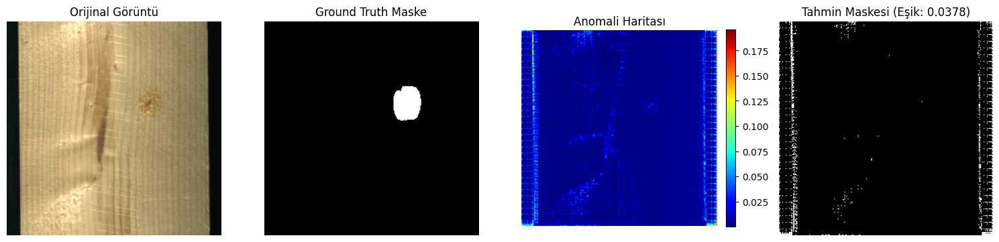

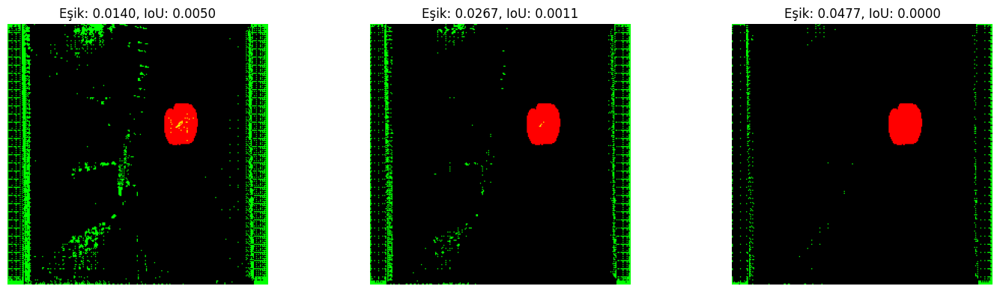

In [ ]:
# ========================== IoU DEBUG İÇİN EK ANALİZ ==========================

def debug_iou_problem():
    print("\n===== IoU SORUNU ANALİZİ =====")

    # Ground truth maskeleri ve veri yolu sorunlarını kontrol et
    test_defect_dir = os.path.join(DATASET_PATH, "test", "defect")
    ground_truth_dir = os.path.join(DATASET_PATH, "ground_truth", "defect")

    if not os.path.exists(test_defect_dir):
        print(f"HATA: Test defect dizini bulunamadı: {test_defect_dir}")
        return

    if not os.path.exists(ground_truth_dir):
        print(f"HATA: Ground truth dizini bulunamadı: {ground_truth_dir}")
        return

    # Bir örnek test görüntüsü ve maskesini al
    for model_name, model in models_dict.items():
        print(f"\n>> {model_name} için anomali haritası ve maske analizi <<")
        model.eval()

        with torch.no_grad():
            for images, gt_masks, paths in test_defect_loader:
                if images.size(0) == 0:
                    print("Batch'te görüntü yok!")
                    continue

                # İlk görüntüyü al
                image = images[0:1].to(device)
                gt_mask = gt_masks[0:1]
                img_path = paths[0]

                # Anomali haritası oluştur
                reconstructed = model(image)
                anomaly_map_batch = F.mse_loss(reconstructed, image, reduction='none')
                anomaly_map = torch.mean(anomaly_map_batch, dim=1, keepdim=True)

                # İstatistikleri topla
                anomaly_min = anomaly_map.min().item()
                anomaly_max = anomaly_map.max().item()
                anomaly_mean = anomaly_map.mean().item()

                gt_min = gt_mask.min().item()
                gt_max = gt_mask.max().item()
                gt_nonzeros = (gt_mask > 0).sum().item()
                total_pixels = gt_mask.numel()

                # Ground truth dosya adı kontrolü
                img_filename = os.path.basename(img_path)
                base_name = os.path.splitext(img_filename)[0]

                possible_mask_names = [
                    f"{base_name}.png",
                    f"{base_name}.jpg",
                    f"{base_name}_mask.png",
                    f"{base_name}_mask.jpg"
                ]

                found_mask_file = None
                for mask_name in possible_mask_names:
                    mask_path = os.path.join(ground_truth_dir, mask_name)
                    if os.path.exists(mask_path):
                        found_mask_file = mask_path
                        break

                # Sonuçları yazdır
                print(f"Görüntü: {img_filename}")
                print(f"GT Mask nonzero pikseller: {gt_nonzeros}/{total_pixels} ({gt_nonzeros/total_pixels*100:.2f}%)")
                print(f"GT Maske değer aralığı: [{gt_min:.4f}, {gt_max:.4f}]")
                print(f"Anomali haritası değer aralığı: [{anomaly_min:.6f}, {anomaly_max:.6f}], Ort: {anomaly_mean:.6f}")

                if found_mask_file:
                    print(f"Bulunan maske dosyası: {os.path.basename(found_mask_file)}")
                else:
                    print(f"DİKKAT: Maske dosyası bulunamadı!")
                    possible_files = os.listdir(ground_truth_dir)[:5] if os.path.exists(ground_truth_dir) else []
                    print(f"Ground truth dizinindeki ilk dosyalar: {possible_files}")

                # Farklı eşik değerleri ile IoU hesaplaması
                print("\nFarklı eşik değerleri ile IoU:")

                anomaly_cpu = anomaly_map[0, 0].cpu().numpy()
                gt_cpu = gt_mask[0, 0].cpu().numpy()

                # Daha akıllı bir eşik stratejisi deneyelim
                percentiles = [50, 75, 90, 95, 97, 98, 99]
                for p in percentiles:
                    threshold = np.percentile(anomaly_cpu, p)
                    pred_mask = (anomaly_cpu > threshold).astype(np.int32)

                    if np.sum(gt_cpu) == 0:
                        print(f"UYARI: GT maskesi boş!")
                        iou = 0 if np.sum(pred_mask) > 0 else 1
                    else:
                        intersection = np.logical_and(pred_mask, gt_cpu).sum()
                        union = np.logical_or(pred_mask, gt_cpu).sum()
                        iou = intersection / union if union > 0 else 0

                    print(f"Eşik (p{p}): {threshold:.6f}, IoU: {iou:.4f}, "
                          f"Pozitif pikseller: {np.sum(pred_mask)}/{pred_mask.size}")

                # Görselleştirme
                plt.figure(figsize=(15, 5))

                plt.subplot(1, 4, 1)
                plt.title("Orijinal Görüntü")
                plt.imshow(image[0].permute(1, 2, 0).cpu().numpy())
                plt.axis('off')

                plt.subplot(1, 4, 2)
                plt.title("Ground Truth Maske")
                plt.imshow(gt_mask[0, 0].cpu().numpy(), cmap='gray')
                plt.axis('off')

                plt.subplot(1, 4, 3)
                plt.title("Anomali Haritası")
                plt.imshow(anomaly_cpu, cmap='jet')
                plt.colorbar(fraction=0.046, pad=0.04)
                plt.axis('off')

                # En iyi IoU eşiği ile maske
                best_threshold = np.percentile(anomaly_cpu, 97)  # 97. yüzdelik deneyelim
                pred_mask = (anomaly_cpu > best_threshold).astype(np.int32)

                plt.subplot(1, 4, 4)
                plt.title(f"Tahmin Maskesi (Eşik: {best_threshold:.4f})")
                plt.imshow(pred_mask, cmap='gray')
                plt.axis('off')

                plt.tight_layout()
                plt.show()

                # Birkaç farklı eşik değeri ile sonuçları göster
                plt.figure(figsize=(15, 4))
                thresholds = [
                    np.percentile(anomaly_cpu, 90),
                    np.percentile(anomaly_cpu, 95),
                    np.percentile(anomaly_cpu, 98)
                ]

                for i, thresh in enumerate(thresholds):
                    plt.subplot(1, 3, i+1)
                    pred = (anomaly_cpu > thresh).astype(np.float32)

                    # Çakışma görselleştirmesi
                    overlap = np.zeros((anomaly_cpu.shape[0], anomaly_cpu.shape[1], 3))
                    overlap[:,:,0] = gt_cpu  # Kırmızı kanal (GT)
                    overlap[:,:,1] = pred    # Yeşil kanal (tahmin)

                    intersection = np.logical_and(pred, gt_cpu).sum()
                    union = np.logical_or(pred, gt_cpu).sum()
                    iou = intersection / union if union > 0 else 0

                    plt.imshow(overlap)
                    plt.title(f"Eşik: {thresh:.4f}, IoU: {iou:.4f}")
                    plt.axis('off')

                plt.tight_layout()
                plt.show()

                break  # Sadece ilk görüntüyü analiz et

            break  # Sadece ilk batch'i analiz et

# Analiz fonksiyonunu çağır
debug_iou_problem()

In [ ]:
# ========================== VERİ YOLU VE MASKE KONTROLÜ ==========================

# Google Drive'daki yolların kontrolü

import os

test_defect_dir = os.path.join(DATASET_PATH, "test", "defect")
ground_truth_dir = os.path.join(DATASET_PATH, "ground_truth", "defect")

# Test/defect klasörünün varlığını kontrol et
if not os.path.exists(test_defect_dir):
    print(f"Hata: Test arıza dizini bulunamadı: {test_defect_dir}")
else:
    test_images_full_paths = sorted([os.path.join(test_defect_dir, f)
                                    for f in os.listdir(test_defect_dir) if f.endswith(".jpg")])

    # Kontrol ve log
    if not test_images_full_paths:
        print(f"Uyarı: {test_defect_dir} dizininde hiç '.jpg' dosyası bulunamadı.")
    else:
        for test_image_path in test_images_full_paths:
            test_image_name = os.path.basename(test_image_path) # Sadece dosya adını al

            base_name = os.path.splitext(test_image_name)[0]
            expected_mask_name = f"{base_name}_mask.jpg"
            expected_mask_path = os.path.join(ground_truth_dir, expected_mask_name)

            print(f"Test dosyası tam yolu: {test_image_path}")
            print(f"Beklenen maske yolu:   {expected_mask_path}")

            if os.path.exists(expected_mask_path):
                print("Durum                : ✅ Maske bulundu.\n")
            else:
                print("Durum                : ❌ Maske BULUNAMADI! Lütfen yolu ve dosya adını kontrol edin.\n")

Test dosyası tam yolu: /content/drive/MyDrive/wood_dataset/wood/test/defect/100000000.jpg
Beklenen maske yolu:   /content/drive/MyDrive/wood_dataset/wood/ground_truth/defect/100000000_mask.jpg
Durum                : ✅ Maske bulundu.

Test dosyası tam yolu: /content/drive/MyDrive/wood_dataset/wood/test/defect/100000003.jpg
Beklenen maske yolu:   /content/drive/MyDrive/wood_dataset/wood/ground_truth/defect/100000003_mask.jpg
Durum                : ✅ Maske bulundu.

Test dosyası tam yolu: /content/drive/MyDrive/wood_dataset/wood/test/defect/100000006.jpg
Beklenen maske yolu:   /content/drive/MyDrive/wood_dataset/wood/ground_truth/defect/100000006_mask.jpg
Durum                : ✅ Maske bulundu.

Test dosyası tam yolu: /content/drive/MyDrive/wood_dataset/wood/test/defect/100000007.jpg
Beklenen maske yolu:   /content/drive/MyDrive/wood_dataset/wood/ground_truth/defect/100000007_mask.jpg
Durum                : ✅ Maske bulundu.

Test dosyası tam yolu: /content/drive/MyDrive/wood_dataset/wood/